In [110]:
import pandas as pd
from Main import settings, features, pf_set
import time
import pickle
from pandas.tseries.offsets import DateOffset
import Prepare_Data
import data_run_files
import return_prediction_functions
from return_prediction_functions import rff
import numpy as np
from pandas.tseries.offsets import MonthEnd
from sklearn.linear_model import Ridge
import General_Functions
import pickle
import Estimate_Covariance_Matrix
import os
import prepare_portfolio_data
import portfolio_choice_functions
import scipy.linalg
import functools
from scipy.optimize import minimize
import datetime
import itertools
start_date = pd.to_datetime('1952-12-31')

folder_name = "much_more_data"
output_path = os.path.join(folder_name, "")  # Hvis du har brug for en sti, der refererer til mappen selv


file_path_cluster_labels = "Data/Cluster Labels.csv"
file_path_factor_details = "Data/Factor Details.xlsx"



In [111]:
pickle_file_path = os.path.join(folder_name, "model_1.pkl")
pickle_file_path_1 = os.path.join(folder_name, "demeaned_model_1.pkl")
wealth_path = os.path.join(folder_name, "wealth.csv")
barra_file_path = os.path.join(folder_name, "barra_cov.pkl")
output_path_market_returns = os.path.join(folder_name, "market_returns_test.csv")

risk_free_path = os.path.join(folder_name, "risk_free_test.csv")
output_data_ret_csv = os.path.join(folder_name, "data_ret.csv")
output_data_ret_ld1_csv = os.path.join(folder_name, "data_ret_ld1.csv")

daily_path = os.path.join(folder_name, "daily.csv")
chars_path = os.path.join(folder_name, "chars_behandlet.parquet")

file_path_cluster_labels = "Data/Cluster Labels.csv"
file_path_factor_details = "Data/Factor Details.xlsx"

In [112]:
output_path = os.path.join(".", folder_name, "")
market_path = os.path.join(".", folder_name, "market_returns_test.csv")
pickle_file_path = os.path.join(".", folder_name, "model_1.pkl")
wealth_path = os.path.join(".", folder_name, "wealth.csv")
barra_file_path = os.path.join(".", folder_name, "barra_cov.pkl")
output_path_market_returns = os.path.join(folder_name, "market_returns_test.csv")

risk_free_path = os.path.join(".", folder_name, "risk_free_test.csv")
output_data_ret_csv = os.path.join(".", folder_name, "data_ret.csv")
output_data_ret_ld1_csv = os.path.join(".", folder_name, "data_ret_ld1.csv")
daily_path = os.path.join(".", folder_name, "daily.csv")
chars_path = os.path.join(".", folder_name, "chars_behandlet.parquet")
file_path_world_ret = os.path.join(".", folder_name, "world_ret_test.csv")
daily_file_path = os.path.join(".", folder_name, "usa_dsf_test.parquet")
output_path_usa = os.path.join(".", folder_name, "usa_test.parquet")
output_path_chars_behandlet =  os.path.join(".", folder_name, "chars_behandlet.parquet")
output_path_daily = os.path.join(".", folder_name, "daily.csv")
# Paths for Data-mappen forbliver uændrede
file_path_cluster_labels = os.path.join("Data", "Cluster Labels.csv")
file_path_factor_details = os.path.join("Data", "Factor Details.xlsx")
risk_free_path = os.path.join(".", folder_name, "risk_free_test.csv")
risk_free_path = "./data_fifty/risk_free_test.csv" 
risk_free = data_run_files.process_risk_free_rate(risk_free_path, start_date)

Filtrering udført. Antal rækker efter filtrering: 841
Fil gemt som ./data_test/risk_free_test.csv


# Indlæser wealth, chars, daily, data_ret og data_ret_ld1

In [113]:
wealth = pd.read_csv(wealth_path)
wealth['eom'] = pd.to_datetime(wealth['eom'])
data_ret = pd.read_csv(output_data_ret_csv)
data_ret_ld1 = pd.read_csv(output_data_ret_ld1_csv)
data_ret['eom'] = pd.to_datetime(data_ret['eom'])
data_ret_ld1['eom'] = pd.to_datetime(data_ret_ld1['eom'])
data_ret_ld1['eom_ret'] = pd.to_datetime(data_ret_ld1['eom_ret'])
daily = pd.read_csv(daily_path, parse_dates=["date", "eom"])
chars = pd.read_parquet(chars_path)

In [114]:
chars.shape

(291886, 130)

In [115]:
chars["id"].nunique()


776

Disse er checket og se ser korrekte ud wuhu :D

## Hent Predictions :D

### Indlæsning af Pickle fil (predictions)

In [309]:
with open(pickle_file_path, "rb") as file:
    model_1 = pickle.load(file)

#print(model_1) #Vi bruger dog ikke ikke denne i selve 

In [310]:

with open(pickle_file_path_1, "rb") as file:
    demeaned_model_1 = pickle.load(file)

#print(model_1) #Vi bruger dog ikke ikke denne i selve 

In [311]:
chars["ret_ld1"].mean()

0.011800928799677009

In [312]:
chars["tr_ld1"].mean()

0.014131514139807084

# Barra COV

Just a quick check

In [27]:
with open(barra_file_path, "rb") as file:
    barra_cov = pickle.load(file)

In [23]:
print(barra_cov['2022-11-30']['ivol_vec'])

id
10104    0.004393
10107    0.002484
10138    0.003305
10145    0.001845
10516    0.003597
           ...   
87432    0.003639
87447    0.003513
87717    0.003873
91556    0.007317
92655    0.002863
Name: res_vol, Length: 307, dtype: float64


# Prepare Portfolio Data - tilføj return predictions, lambda list og datoer

In [8]:
file_path = os.path.join(output_path, f"demeaned_model_{1}.pkl")
with open(file_path, 'rb') as f:
    model_dict = pickle.load(f)

In [24]:
def add_return_predictions(chars, settings, get_from_path_model):
    for h in range(1, 2):  # Hardcoded: 1 horizon
        file_path = os.path.join(get_from_path_model, f"demeaned_model_{h}.pkl")
        with open(file_path, 'rb') as f:
            model_dict = pickle.load(f)  # Indlæs pickle-fil

        # Ekstraher og fjern den månedlige gennemsnits-dataFrame fra model_dict
 #       monthly_means_df = model_dict["monthly_means_df"]
 #       del model_dict["monthly_means_df"]

        # Iterer over dato-nøgler og udtræk forudsigelser
        all_preds = []
        for date_key, subdict in model_dict.items():
            # Antag at hver subdictionary indeholder en key "pred"
            pred_df = pd.DataFrame(subdict['pred'])
            all_preds.append(pred_df)
            
        # Saml alle forudsigelsesdata
        pred_df_all = pd.concat(all_preds, ignore_index=True)
        pred_df_all = pred_df_all[['id', 'eom', 'pred']].rename(columns={'pred': f'pred_ld{h}'})
        
        # Først merge de de-meanede forudsigelser ind i chars
        chars = chars.merge(pred_df_all, on=['id', 'eom'], how='left')
        # Dernæst merge monthly means (gennemsnitsafkast) ind i chars baseret på 'eom'
   #     chars = chars.merge(monthly_means_df, on='eom', how='left')
        # Tilføj det månedlige gennemsnitsafkast til de de-meanede forudsigelser for at få den endelige prediction
        # Fjern eventuelt mean_ret-kolonnen, hvis du ikke behøver den
    #    chars = chars.drop(columns=['mean_ret'])
        
    return chars


In [217]:
chars.shape

(291886, 130)

In [26]:
# gamle men burde give det samme som den næste

In [19]:
def add_return_predictions(chars, settings, get_from_path_model):

    for h in range(1, 2):  # Hardcoded: 1 horizon
        file_path = os.path.join(get_from_path_model, f"model_1_with_market_as_feature.pkl")
        with open(file_path, 'rb') as f:
            model_dict = pickle.load(f)  # Indlæs pickle-fil

        # Iterer kun over keys, der er datetime-objekter
        all_preds = []
        for date_key, subdict in model_dict.items():
            if isinstance(date_key, datetime.datetime):
                pred_df = pd.DataFrame(subdict['pred'])
                all_preds.append(pred_df)
                
        # Saml alle forudsigelsesdata, hvis der er nogen
        if all_preds:
            pred_df_all = pd.concat(all_preds, ignore_index=True)
            # Hvis 'eom' ikke findes, men der findes 'eom_x' (og evt. 'eom_y' og 'eom_pred_last'),
            # så kopier 'eom_x' til 'eom' og fjern de andre
            if 'eom' not in pred_df_all.columns:
                if 'eom_x' in pred_df_all.columns:
                    pred_df_all['eom'] = pred_df_all['eom_x']
                    cols_to_drop = [col for col in ['eom_x', 'eom_y', 'eom_pred_last'] if col in pred_df_all.columns]
                    pred_df_all = pred_df_all.drop(columns=cols_to_drop)
                else:
                    raise KeyError(f"'eom' not found in prediction DataFrame columns: {pred_df_all.columns}")
            
            pred_df_all = pred_df_all[['id', 'eom', 'pred']].rename(columns={'pred': f'pred_ld{h}'})
            
            # Merge de de-meanede forudsigelser ind i chars
            chars = chars.merge(pred_df_all, on=['id', 'eom'], how='left')
            
            # Fjern 'mean_ret'-kolonnen, hvis den findes
            if 'mean_ret' in chars.columns:
                chars = chars.drop(columns=['mean_ret'])
        else:
            print(f"Ingen forudsigelser fundet for horizon {h}.")
        
    return chars


In [18]:
chars_normal = prepare_portfolio_data.add_return_predictions(chars,settings, output_path)

C:\Users\andre\anaconda3\envs\fin_econ2024\Lib\site-packages\sklearn\base.py:380: InconsistentVersionWarning: Trying to unpickle estimator Ridge from version 1.5.2 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
C:\Users\andre\anaconda3\envs\fin_econ2024\Lib\site-packages\sklearn\base.py:380: InconsistentVersionWarning: Trying to unpickle estimator Ridge from version 1.5.2 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
C:\Users\andre\anaconda3\envs\fin_econ2024\Lib\site-packages\sklearn\base.py:380: InconsistentVersionWarning: Trying to unpickle estimator Ridge from version 1.5.2 when using version 1.6.1. This might lead to breaking code o

In [20]:
chars_with_new_market_feature = add_return_predictions(chars,settings, output_path)

C:\Users\andre\anaconda3\envs\fin_econ2024\Lib\site-packages\sklearn\base.py:380: InconsistentVersionWarning: Trying to unpickle estimator Ridge from version 1.5.2 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
C:\Users\andre\anaconda3\envs\fin_econ2024\Lib\site-packages\sklearn\base.py:380: InconsistentVersionWarning: Trying to unpickle estimator Ridge from version 1.5.2 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
C:\Users\andre\anaconda3\envs\fin_econ2024\Lib\site-packages\sklearn\base.py:380: InconsistentVersionWarning: Trying to unpickle estimator Ridge from version 1.5.2 when using version 1.6.1. This might lead to breaking code o

In [21]:
print(chars_normal.shape)
print(chars_with_new_market_feature.shape)

(291886, 131)
(291886, 131)


In [223]:
print(chars_demeaned_old.shape)
print(chars_demeaned_new.shape)

(291886, 131)
(291886, 131)


In [91]:
def r2_oos(df, actual_col="ret_ld1", pred_col="pred_ld1"):
    """
    Beregner out-of-sample R^2 (R2_oos) for predictive performance.
    
    Args:
        df (pd.DataFrame): DataFrame med kolonner for faktisk og forudsagt return.
        actual_col (str): Kolonnenavn for faktisk afkast.
        pred_col (str): Kolonnenavn for forudsagt afkast.
    
    Returns:
        float: Out-of-sample R²
    """
    numerator = np.sum((df[actual_col] - df[pred_col]) ** 2)
    denominator = np.sum(df[actual_col] ** 2)

    if denominator == 0:
        return np.nan  # Undgå division med 0

    return 1 - numerator / denominator


In [98]:

valgt_dato = "2011-01-01"

# Filtrer hele DataFrame baseret på 'eom'-kolonnen
chars_normal_test = chars_normal[chars_normal["eom"] > valgt_dato]

chars_with_new_market_feature_test = chars_with_new_market_feature[chars_with_new_market_feature["eom"] > valgt_dato]


In [99]:
chars_normal_r2 = r2_oos(df = chars_normal_test)

chars_with_new_market_feature_r2 = r2_oos(df = chars_with_new_market_feature_test)

In [100]:
print(chars_normal_r2)

0.10343823891342463


In [101]:
chars_with_new_market_feature_r2

0.10387402503603249

In [109]:
chars_normal["pred_ld1"]

0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
            ...   
291881    0.010047
291882    0.009909
291883    0.008984
291884    0.011028
291885    0.010914
Name: pred_ld1, Length: 291886, dtype: float64

In [107]:
chars_with_new_market_feature["pred_ld1"]

0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
            ...   
291881    0.008613
291882    0.007253
291883    0.007983
291884    0.009292
291885    0.009820
Name: pred_ld1, Length: 291886, dtype: float64

# Analyse af forskellen

In [22]:
# Tæl antallet af NaNs i kolonnen 'pred_ld1' for chars_new
nan_count_new = chars_normal['pred_ld1'].isna().sum()

# Tæl antallet af NaNs i kolonnen 'pred_ld1' for chars_old
nan_count_old = chars_with_new_market_feature['pred_ld1'].isna().sum()

print("Antal NaNs i chars_new:", nan_count_new)
print("Antal NaNs i chars_old:", nan_count_old)

print("diff i NaNs:", nan_count_new-nan_count_old)

Antal NaNs i chars_new: 110027
Antal NaNs i chars_old: 110027
diff i NaNs: 0


In [325]:
output_path

'.\\new_data\\'

In [23]:
print(chars_normal["pred_ld1"].mean())
print(chars_with_new_market_feature["pred_ld1"].mean())


0.009979487111090798
0.010019353269711692


In [25]:
lambda_list = prepare_portfolio_data.create_lambda_list(chars_with_new_market_feature)

In [28]:
first_cov_date, hp_years, start_oos = prepare_portfolio_data.define_important_dates(barra_cov, settings)
date_ranges = prepare_portfolio_data.create_date_ranges(settings, first_cov_date, start_oos, hp_years)
dates_m1 = date_ranges["dates_m1"]
dates_m2 = date_ranges["dates_m2"]
dates_oos = date_ranges["dates_oos"]
dates_hp = date_ranges["dates_hp"]
#Disse er alle korrekte

In [110]:
lambda_list = prepare_portfolio_data.create_lambda_list(chars_demeaned_new)
first_cov_date, hp_years, start_oos = prepare_portfolio_data.define_important_dates(barra_cov, settings)
date_ranges = prepare_portfolio_data.create_date_ranges(settings, first_cov_date, start_oos, hp_years)
dates_m1 = date_ranges["dates_m1"]
dates_m2 = date_ranges["dates_m2"]
dates_oos = date_ranges["dates_oos"]
dates_hp = date_ranges["dates_hp"]
#Disse er alle korrekte

# Base cases

In [29]:
wealth_new

NameError: name 'wealth_new' is not defined

In [50]:
def rp_risky_fun(data, cov_list, wealth, dates, gam):
    """
    Returnerer en portefølje baseret på Risk Parity-princippet, 
    men her udledes vægtene direkte ud fra den reciprokke volatilitet
    (dvs. vægt ∝ 1/vol), i stedet for at bruge numerisk optimering.
    
    Parametre:
        data      : DataFrame med de relevante data (skal indeholde kolonnerne 'id', 'eom', 
                    'me', 'tr_ld1', 'pred_ld1' og 'valid')
        cov_list  : Dictionary med kovariansmatricer for hver dato, fx {dato: cov_mat, ...}
        wealth    : Den samlede formue, der investeres
        dates     : Liste af datoer, som porteføljen skal konstrueres for
        gam       : Risikoaversion (bruges ved porteføljeudregningen i pf_ts_fun)
    
    Returnerer:
        Et dictionary med nøglerne:
         - "w": DataFrame med vægtene (inkluderer fx kolonnerne 'id', 'eom', 'w_start', 'w', 'tr_ld1', 'mu_ld1')
         - "pf": DataFrame med porteføljens performance ('inv', 'shorting', 'turnover', 'r', 'tc', 'eom_ret', 'type')
    """
    import numpy as np
    import pandas as pd
    from pandas.tseries.offsets import MonthEnd

    # Indlejret funktion til at opbygge covariance matrix.
    def create_cov(x, ids):
        """
        Konstruerer en kovariansmatrix baseret på en Barra covariance-struktur.
        
        Parametre:
            x   : Dictionary med nøglerne:
                  - 'fct_load': DataFrame med faktorbelastninger (index er id'er).
                  - 'ivol_vec': Series med id‑specifik volatilitet (index er id'er).
                  - 'fct_cov' : DataFrame med faktor‑kovarians.
            ids : Liste eller array af id'er, for hvilke kovariansen skal beregnes.
        
        Returnerer:
            En numpy‑array med dimension (# aktiver x # aktiver). For de id'er, der ikke findes i x['fct_load']
            eller x['ivol_vec'], udfyldes med 0.
        """
        # Sørg for, at id'erne er strings
        ids = pd.Index(ids).astype(str)
        # Reindex så manglende id'er får 0
        fct_load = x['fct_load'].reindex(ids, fill_value=0)
        ivol = x['ivol_vec'].reindex(ids, fill_value=0)
        return fct_load @ x['fct_cov'] @ fct_load.T + np.diag(ivol)
    
    # Filtrér data – inklusiv kun gyldige observationer for de relevante datoer.
    data = data[(data['valid'] == True) & (data['eom'].isin(dates))].copy()
    data_rel = data.loc[data["valid"] & data["eom"].isin(dates),
                        ["id", "eom", "me", "tr_ld1", "pred_ld1"]]
    data_rel = data_rel.sort_values(by=["id", "eom"])
    
    # Gruppér data efter dato
    data_split = {key: group for key, group in data_rel.groupby("eom")}
    
    # Liste til at gemme de beregnede risk parity-vægte for hver dato
    rp_opt_all = []
    
    for d in dates:
        data_sub = data_split[d]
        
        # For at undgå lookahead bias, brug en måned før d til at beregne kovariansmatricen:
        d_prev = d - MonthEnd(1)
        d_str = d_prev.strftime('%Y-%m-%d')
        
        # Konstruer kovariansmatricen for d_prev (historiske data)
        sig = create_cov(cov_list[d_str], data_sub["id"])
        
        # Beregn volatiliteten: sigma_i = sqrt(diagonal element for aktiv i)
        vol = np.sqrt(np.diag(sig))
        
        # Udregn vægte: w_i = (1/sigma_i) / sum(1/sigma_j)
        w = (1 / vol) / np.sum(1 / vol)
        
        # Gem vægtene for denne dato
        weights_df = pd.DataFrame({
            "id": data_sub["id"],
            "eom": d,  # Porteføljen konstrueres for dato d
            "w": w
        })
        rp_opt_all.append(weights_df)
    
    # Kombiner alle de beregnede vægte til ét samlet DataFrame
    rp_opt_all = pd.concat(rp_opt_all)
    
    # Udregn de endelige portefølje-vægte via w_fun (f.eks. beregner den startvægte og fusionerer med de beregnede vægte)
    weights_portfolio = portfolio_choice_functions.w_fun(data_rel, dates, rp_opt_all, wealth)
    
    # Beregn porteføljens performance-tidsserie via pf_ts_fun
    portfolio = portfolio_choice_functions.pf_ts_fun(weights_portfolio, data, wealth, gam)
    portfolio["type"] = "Risk Parity"
    
    # Returner et dictionary med vægtdata ("w") og performance ("pf")
    return {"w": weights_portfolio, "pf": portfolio}


In [65]:
# Udregning af wealth
wealth_end_new = 1
end = settings["split"]["test_end"]
market_test = Prepare_Data.load_and_filter_market_returns_test(market_path)
wealth_new = Prepare_Data.wealth_func(wealth_end_new, end, market_test, risk_free)

Filen er indlæst og filtreret succesfuldt.


In [230]:
wealth_end_new

1000000000

In [127]:
#rp = rp_risky_fun(data=chars, cov_list=barra_cov, wealth=wealth, dates=dates_oos, gam=pf_set["gamma_rel"])

In [66]:
ew = portfolio_choice_functions.ew_implement(data=chars_with_new_market_feature, wealth=wealth_new, dates=dates_oos, pf_set=pf_set)
mkt = portfolio_choice_functions.mkt_implement(data=chars_with_new_market_feature, wealth=wealth_new, dates=dates_oos, pf_set= pf_set)
rw = portfolio_choice_functions.rw_implement(data=chars_with_new_market_feature, wealth=wealth_new, dates=dates_oos, pf_set= pf_set)
mv = portfolio_choice_functions.mv_implement(data=chars_with_new_market_feature, cov_list=barra_cov ,wealth=wealth_new, dates=dates_oos, pf_set= pf_set)
factor_ml = portfolio_choice_functions.factor_ml_implement(data = chars_with_new_market_feature, wealth = wealth_new, dates= dates_oos, n_pfs=settings["factor_ml"]["n_pfs"]
, gam=pf_set['gamma_rel'])
tpf = portfolio_choice_functions.tpf_implement(data=chars_with_new_market_feature, cov_list=barra_cov, wealth=wealth, dates=dates_oos, gam=pf_set["gamma_rel"])
#rp = rp_risky_fun(data=chars, cov_list=barra_cov, wealth=wealth_new, dates=dates_oos, gam=pf_set["gamma_rel"])

In [75]:
# chars fra R

# STATIC ML

In [52]:
def create_lambda(x, ids):
    return np.diag([x[i] for i in ids])


In [53]:
def static_val_fun(data, dates, cov_list, lambda_list, wealth, cov_type, gamma_rel, k=None, g=None, u=None, hps=None):
    """
    Beregner de statiske vægte for de angivne datoer.
    Parametre:
      - data: DataFrame med portefølje-data.
      - dates: Liste af datoer (som datetime-objekter).
      - cov_list: Dictionary med covariance-data pr. dato.
      - lambda_list: Dictionary med lambda-data pr. dato.
      - wealth: DataFrame med wealth-information (skal indeholde 'eom' og 'wealth', evt. 'mu_ld1').
      - cov_type: Type til justering af covariance.
      - gamma_rel: Skalar til vægtning.
      - k, g, u: Parametre, kan angives direkte.
      - hps: DataFrame med hyperparametre; hvis angivet, opdateres k, g og u for hver dato.
    """
    # Start med initiale weights (f.eks. VW, alt efter initial_weights_new)
    static_weights = General_Functions.initial_weights_new(data, w_type="vw")
    
    # Merge med kolonner fra data: id, eom, tr_ld1 og pred_ld1
    static_weights = static_weights.merge(data[['id', 'eom', 'tr_ld1', 'pred_ld1']], on=['id', 'eom'], how='left')
    # Merge med wealth for at få mu_ld1
    static_weights = static_weights.merge(wealth[['eom', 'mu_ld1']], on='eom', how='left')
    
    for d in dates:
        # Hvis hyperparametre (hps) er angivet, så opdater k, g og u
        if hps is not None:
            # Filtrer rækker hvor året for eom_ret er mindre end året for d
            hp_candidates = hps[hps['eom_ret'].dt.year < d.year]
            if not hp_candidates.empty:
                # Vælg den række med den seneste eom_ret
                hp = hp_candidates.loc[hp_candidates['eom_ret'].idxmax()]
                g = hp['g']
                u = hp['u']
                k = hp['k']
        
        # Hent wealth for datoen
        wealth_t_series = wealth.loc[wealth['eom'] == d, 'wealth']
        if wealth_t_series.empty:
            continue  # Eller håndtér fejlen, hvis der mangler data for d
        wealth_t = wealth_t_series.iloc[0]
        
        # Vælg de rækker i static_weights for datoen d
        mask = static_weights['eom'] == d
        # Sørg for, at id'erne er strenge (for at matche med de oprettede matricer)
        ids = static_weights.loc[mask, 'id'].tolist()

        
        # Byg covariance matrix og tilpas den
        sigma_gam = General_Functions.create_cov(cov_list[d], ids=ids) * gamma_rel

        sigma_gam = General_Functions.sigma_gam_adj(sigma_gam, g=g, cov_type=cov_type)
        
        # Byg lambda matrix og skaler med k
        lambda_val = create_lambda(lambda_list[d], ids=ids)
        lambda_val = lambda_val * k
        
        # Ekstraher de nødvendige kolonner som numpy-arrays
        pred_ld1 = static_weights.loc[mask, 'pred_ld1'].values
        w_start = static_weights.loc[mask, 'w_start'].values
        
        # Beregn højresidevektoren: pred_ld1 * u + wealth_t * (lambda @ w_start)
        rhs = (pred_ld1 * u) + wealth_t * (lambda_val.dot(w_start))
        # Matrix A: sigma_gam + wealth_t * lambda
        A = sigma_gam + wealth_t * lambda_val
        # Løs lineært system for at få nye vægte
        w_new = np.linalg.solve(A, rhs)
        # Tildel de beregnede vægte til kolonnen 'w' for de relevante rækker
        static_weights.loc[mask, 'w'] = w_new
        
        # Opdater startvægt for næste måned:
        try:
            current_index = list(dates).index(d)
            next_month = dates[current_index + 1]
        except IndexError:
            # Hvis der ikke er nogen næste dato, springes opdateringen over
            continue
        
        # Udregn 'w_opt_lag1' for de rækker, der svarer til d, men til næste måned
        temp = static_weights.loc[mask, ['id', 'w', 'tr_ld1', 'mu_ld1']].copy()
        temp['eom'] = next_month
        temp['w_opt_lag1'] = temp['w'] * (1 + temp['tr_ld1']) / (1 + temp['mu_ld1'])
        
        # Merge temp med static_weights på ['id', 'eom']
        static_weights = static_weights.merge(temp[['id', 'eom', 'w_opt_lag1']], on=['id', 'eom'], how='left')
        
        # Sæt w_start for rækker med eom == next_month
        next_mask = static_weights['eom'] == next_month
        static_weights.loc[next_mask, 'w_start'] = static_weights.loc[next_mask, 'w_opt_lag1']
        static_weights.loc[next_mask & static_weights['w_start'].isna(), 'w_start'] = 0
        
        # Fjern den midlertidige kolonne
        static_weights.drop(columns='w_opt_lag1', inplace=True)
        
    return static_weights


In [54]:
def static_implement(data_tc, cov_list, lambda_list, rf, wealth, mu, gamma_rel,
                     dates_full, dates_oos, dates_hp, hp_years,
                     k_vec, u_vec, g_vec, cov_type, validation=None, seed=None):
    """
    Fuldt statisk implementering.
    Parametre:
      - data_tc: DataFrame med tidsserie-data.
      - cov_list, lambda_list: Ordbøger med covariance- og lambda-data.
      - rf, wealth, mu, gamma_rel: Diverse parametre.
      - dates_full, dates_oos, dates_hp: Lister af datoer (skal være datetime-objekter).
      - hp_years: Årstal for HP-valg.
      - k_vec, u_vec, g_vec: Vektorer med hyperparametre.
      - cov_type: Typen af covariance.
      - validation: Valideringsresultater (kan være None, hvorefter de udregnes).
      - seed: Til eventuel reproducibilitet.
    """
    # Konverter nøglerne i cov_list og lambda_list til pd.Timestamp
    cov_list = {pd.to_datetime(key): value for key, value in cov_list.items()}
    lambda_list = {pd.to_datetime(key): value for key, value in lambda_list.items()}
    
    # Opret HP-grid: alle kombinationer af k, u og g
    static_hps = pd.DataFrame(list(itertools.product(k_vec, u_vec, g_vec)), columns=['k', 'u', 'g'])
    
    # Udvælg relevant data: valid == True og eom i dates_hp, med kolonnerne id, eom, me, tr_ld1, pred_ld1, sorteret efter id og eom
    data_rel = data_tc[(data_tc['valid'] == True) & (data_tc['eom'].isin(dates_hp))][['id', 'eom', 'me', 'tr_ld1', 'pred_ld1']]
    data_rel = data_rel.sort_values(by=['id', 'eom'])
    
    # Hvis der ikke allerede er beregnet validation, udregnes den
    if validation is None:
        validation_list = []
        for i in range(len(static_hps)):
            print(i)
            hp = static_hps.iloc[i]
            static_w = static_val_fun(
                data_rel,
                dates=dates_hp,
                cov_list=cov_list,
                lambda_list=lambda_list,
                wealth=wealth,
                gamma_rel=gamma_rel,
                k=hp['k'],
                g=hp['g'],
                u=hp['u'],
                cov_type=cov_type
            )
            # Anvend pf_ts_fun på resultatet – denne funktion skal returnere en DataFrame med bl.a. 'eom_ret', 'r' og 'tc'
            static_w_pf = General_Functions.pf_ts_fun(static_w, data=data_tc, wealth=wealth, gam=gamma_rel)
            static_w_pf['hp_no'] = i
            static_w_pf['k'] = hp['k']
            static_w_pf['g'] = hp['g']
            static_w_pf['u'] = hp['u']
            validation_list.append(static_w_pf)
        validation = pd.concat(validation_list, ignore_index=True)
    
    # Sortér validation på hp_no og eom_ret
    validation.sort_values(by=['hp_no', 'eom_ret'], inplace=True)
    
    # Beregn kumulative middelværdier (cummean) per hp_no
    validation['cum_mean_r2'] = validation.groupby('hp_no')['r'].transform(lambda x: x.pow(2).expanding().mean())
    validation['cum_mean_r']  = validation.groupby('hp_no')['r'].transform(lambda x: x.expanding().mean())
    validation['cum_var'] = validation['cum_mean_r2'] - validation['cum_mean_r'] ** 2
    
    # Beregn cum_obj for hver hp_no: cummean(r - tc - 0.5 * cum_var * gamma_rel)
    def compute_cum_obj(group):
        return (group['r'] - group['tc'] - 0.5 * group['cum_var'] * gamma_rel).expanding().mean()
    
    validation['cum_obj'] = validation.groupby('hp_no', group_keys=False).apply(compute_cum_obj)
    
    # Beregn rangering inden for hver eom_ret-gruppe baseret på -cum_obj
    validation['rank'] = validation.groupby('eom_ret')['cum_obj'].rank(ascending=False, method='first')
    
    # Vælg de optimale HP'er: de rækker hvor eom_ret har måned == 12 og rank == 1, sorteret efter eom_ret
    optimal_hps = validation[(validation['eom_ret'].dt.month == 12) & (validation['rank'] == 1)].sort_values(by='eom_ret')
    
    # Implementér den endelige portefølje: vælg data_tc hvor eom i dates_oos og valid == True
    w_data = data_tc[(data_tc['eom'].isin(dates_oos)) & (data_tc['valid'] == True)][['id', 'eom', 'me', 'tr_ld1', 'pred_ld1']]
    w = static_val_fun(
        w_data,
        dates=dates_oos,
        cov_list=cov_list,
        lambda_list=lambda_list,
        wealth=wealth,
        gamma_rel=gamma_rel,
        hps=optimal_hps,
        cov_type=cov_type
    )
    
    pf = General_Functions.pf_ts_fun(w, data=data_tc, wealth=wealth, gam=gamma_rel)
    pf['type'] = "Static-ML*"
    
    return {"hps": validation, "best_hps": optimal_hps, "w": w, "pf": pf}


In [34]:
import matplotlib.pyplot as plt

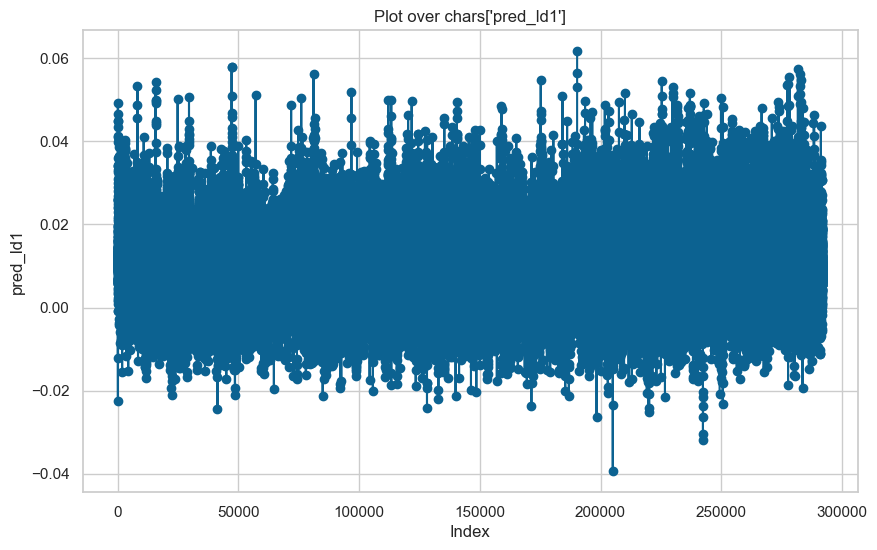

In [36]:
plt.figure(figsize=(10, 6))
plt.plot(chars_with_new_market_feature["pred_ld1"], marker='o', linestyle='-')
plt.xlabel("Index")
plt.ylabel("pred_ld1")
plt.title("Plot over chars['pred_ld1']")
plt.grid(True)
plt.show()


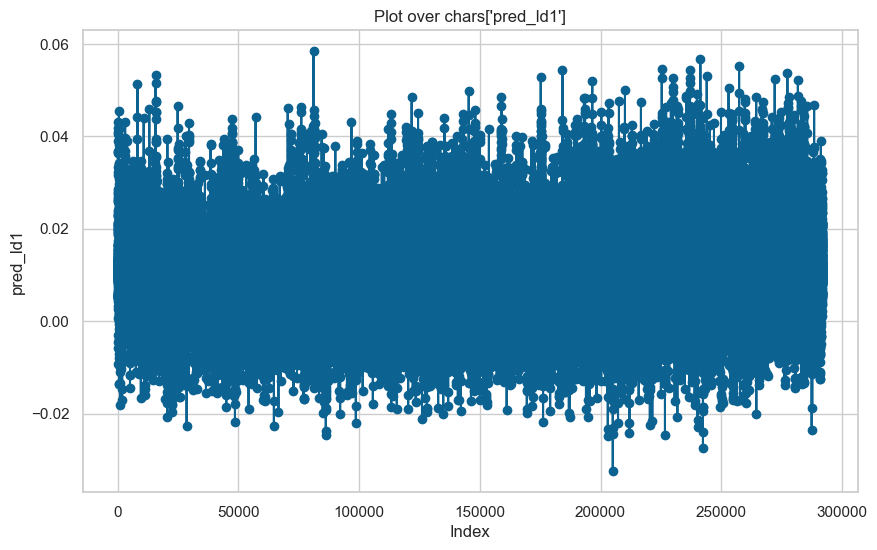

In [35]:
plt.figure(figsize=(10, 6))
plt.plot(chars_normal["pred_ld1"], marker='o', linestyle='-')
plt.xlabel("Index")
plt.ylabel("pred_ld1")
plt.title("Plot over chars['pred_ld1']")
plt.grid(True)
plt.show()


In [68]:
static = static_implement(
    data_tc=chars_with_new_market_feature,
    cov_list=barra_cov,
    lambda_list=lambda_list,
    rf=risk_free,              # Data
    wealth=wealth_new,
    mu=pf_set['mu'],
    gamma_rel= 10, #pf_set['gamma_rel'],  # Investor
    dates_full=dates_m1,
    dates_oos=dates_oos,
    dates_hp=dates_hp,
    hp_years=hp_years,          # Dates
    k_vec=settings['pf']['hps']['static']['k'],
    u_vec=settings['pf']['hps']['static']['u'],
    g_vec=settings['pf']['hps']['static']['g'],
    cov_type=settings['pf']['hps']['cov_type'],
    validation=None
)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26


C:\Users\andre\AppData\Local\Temp\ipykernel_3380\3287424247.py:67: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.


In [233]:
folder_name

'much_more_data'

In [69]:
output_path_static = os.path.join(folder_name, "static_with_market_WEALTH1e1_GAMMA10.pkl")
with open(output_path_static, "wb") as f:
    pickle.dump(static, f)

In [70]:
static = static_implement(
    data_tc=chars_with_new_market_feature,
    cov_list=barra_cov,
    lambda_list=lambda_list,
    rf=risk_free,              # Data
    wealth=wealth_new,
    mu=pf_set['mu'],
    gamma_rel= 1, #pf_set['gamma_rel'],  # Investor
    dates_full=dates_m1,
    dates_oos=dates_oos,
    dates_hp=dates_hp,
    hp_years=hp_years,          # Dates
    k_vec=settings['pf']['hps']['static']['k'],
    u_vec=settings['pf']['hps']['static']['u'],
    g_vec=settings['pf']['hps']['static']['g'],
    cov_type=settings['pf']['hps']['cov_type'],
    validation=None
)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26


C:\Users\andre\AppData\Local\Temp\ipykernel_3380\3287424247.py:67: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.


In [71]:
output_path_static = os.path.join(folder_name, "static_with_market_WEALTH1e1_GAMMA1.pkl")
with open(output_path_static, "wb") as f:
    pickle.dump(static, f)

In [72]:
static = static_implement(
    data_tc=chars_with_new_market_feature,
    cov_list=barra_cov,
    lambda_list=lambda_list,
    rf=risk_free,              # Data
    wealth=wealth_new,
    mu=pf_set['mu'],
    gamma_rel= 5, #pf_set['gamma_rel'],  # Investor
    dates_full=dates_m1,
    dates_oos=dates_oos,
    dates_hp=dates_hp,
    hp_years=hp_years,          # Dates
    k_vec=settings['pf']['hps']['static']['k'],
    u_vec=settings['pf']['hps']['static']['u'],
    g_vec=settings['pf']['hps']['static']['g'],
    cov_type=settings['pf']['hps']['cov_type'],
    validation=None
)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26


C:\Users\andre\AppData\Local\Temp\ipykernel_3380\3287424247.py:67: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.


In [73]:
output_path_static = os.path.join(folder_name, "static_with_market_WEALTH1e1_GAMMA5.pkl")
with open(output_path_static, "wb") as f:
    pickle.dump(static, f)

In [74]:
static = static_implement(
    data_tc=chars_with_new_market_feature,
    cov_list=barra_cov,
    lambda_list=lambda_list,
    rf=risk_free,              # Data
    wealth=wealth_new,
    mu=pf_set['mu'],
    gamma_rel= 20, #pf_set['gamma_rel'],  # Investor
    dates_full=dates_m1,
    dates_oos=dates_oos,
    dates_hp=dates_hp,
    hp_years=hp_years,          # Dates
    k_vec=settings['pf']['hps']['static']['k'],
    u_vec=settings['pf']['hps']['static']['u'],
    g_vec=settings['pf']['hps']['static']['g'],
    cov_type=settings['pf']['hps']['cov_type'],
    validation=None
)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26


C:\Users\andre\AppData\Local\Temp\ipykernel_3380\3287424247.py:67: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.


In [75]:
output_path_static = os.path.join(folder_name, "static_with_market_WEALTH1e1_GAMMA20.pkl")
with open(output_path_static, "wb") as f:
    pickle.dump(static, f)

In [76]:
static = static_implement(
    data_tc=chars_with_new_market_feature,
    cov_list=barra_cov,
    lambda_list=lambda_list,
    rf=risk_free,              # Data
    wealth=wealth_new,
    mu=pf_set['mu'],
    gamma_rel= 100, #pf_set['gamma_rel'],  # Investor
    dates_full=dates_m1,
    dates_oos=dates_oos,
    dates_hp=dates_hp,
    hp_years=hp_years,          # Dates
    k_vec=settings['pf']['hps']['static']['k'],
    u_vec=settings['pf']['hps']['static']['u'],
    g_vec=settings['pf']['hps']['static']['g'],
    cov_type=settings['pf']['hps']['cov_type'],
    validation=None
)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26


C:\Users\andre\AppData\Local\Temp\ipykernel_3380\3287424247.py:67: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.


In [77]:
output_path_static = os.path.join(folder_name, "static_with_market_WEALTH1e1_GAMMA100.pkl")
with open(output_path_static, "wb") as f:
    pickle.dump(static, f)

In [80]:
static["pf"]

,inv,shorting,turnover,r,tc,eom_ret,type
0,0.741518,0.359879,1.408664,0.001282,3.429506e-12,2011-01-31,Static-ML*
1,0.472538,0.223010,0.713547,0.003994,2.956149e-12,2011-02-28,Static-ML*
2,0.510175,0.248203,0.514974,0.002907,1.027669e-12,2011-03-31,Static-ML*
3,0.525957,0.255824,0.531663,0.000362,1.440676e-12,2011-04-30,Static-ML*
4,0.557704,0.268473,0.582560,0.000576,1.372438e-12,2011-05-31,Static-ML*
...,...,...,...,...,...,...,...
139,0.160291,0.073602,0.147476,-0.000603,2.258422e-13,2022-08-31,Static-ML*
140,0.164394,0.076093,0.144302,-0.001333,1.841487e-13,2022-09-30,Static-ML*
141,0.162520,0.075735,0.150441,0.000967,2.464348e-13,2022-10-31,Static-ML*
142,0.163874,0.075754,0.153741,0.001427,3.229725e-13,2022-11-30,Static-ML*


In [81]:
static["hps"]

,inv,shorting,turnover,r,tc,eom_ret,hp_no,k,g,u,cum_mean_r2,cum_mean_r,cum_var,cum_obj,rank
0,0.588473,0.281872,1.335438,0.017338,1.071014e-11,2001-01-31,0,1.0,0.0,0.25,0.000301,0.017338,0.000000,0.017338,12.0
1,0.554397,0.264920,0.645444,0.007606,8.297197e-12,2001-02-28,0,1.0,0.0,0.25,0.000179,0.012472,0.000024,0.011880,15.0
2,0.605801,0.291075,0.640590,0.003319,8.780889e-12,2001-03-31,0,1.0,0.0,0.25,0.000123,0.009421,0.000034,0.008453,13.0
3,0.644198,0.309765,0.700795,0.013299,8.460560e-12,2001-04-30,0,1.0,0.0,0.25,0.000137,0.010390,0.000029,0.009307,15.0
4,0.577677,0.274895,0.730426,0.005542,2.021582e-11,2001-05-31,0,1.0,0.0,0.25,0.000115,0.009421,0.000027,0.008287,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7123,0.407517,0.179827,0.364538,-0.002369,1.386598e-12,2022-08-31,26,0.2,2.0,1.00,0.000079,0.002873,0.000071,-0.001493,18.0
7124,0.412736,0.183906,0.357338,-0.004199,1.138278e-12,2022-09-30,26,0.2,2.0,1.00,0.000079,0.002846,0.000071,-0.001517,18.0
7125,0.408919,0.183974,0.369854,0.004211,1.543321e-12,2022-10-31,26,0.2,2.0,1.00,0.000079,0.002851,0.000071,-0.001508,18.0
7126,0.413352,0.184291,0.381657,0.004514,1.995033e-12,2022-11-30,26,0.2,2.0,1.00,0.000079,0.002857,0.000070,-0.001499,18.0


In [82]:


# Sti til din base-mappe
base_path = output_path
# Hent liste over undermapper/filer


# Saml porteføljerne i én DataFrame inklusiv Static-ML
bm_pfs = pd.concat(
    [tpf["pf"], factor_ml["pf"], ew["pf"], mkt["pf"], rw["pf"], mv["pf"], static["pf"]], 
    ignore_index=True
)

# Gem resultatet som CSV
bm_pfs.to_csv(f"{output_path}/bms.csv", index=False)

# Læs CSV-filen med pandas
bm_pfs = pd.read_csv(os.path.join(base_path, "bms.csv"))

# Konverter eom_ret til dato
bm_pfs['eom_ret'] = pd.to_datetime(bm_pfs['eom_ret'])

# Erstat "Rank-Weighted" med "Rank-ML" i kolonnen type
bm_pfs.loc[bm_pfs['type'] == 'Rank-Weighted', 'type'] = 'Rank-ML'

pfs = bm_pfs


In [83]:
pfs["type"].unique()

array(['Markowitz-ML', 'Factor-ML', '1/N', 'Market', 'Rank-ML',
       'Minimum Variance', 'Static-ML*'], dtype=object)

In [84]:
static_ml_star = pfs[pfs['type'] == "Static-ML*"]
static_ml_star

,inv,shorting,turnover,r,tc,eom_ret,type
864,0.741518,0.359879,1.408664,0.001282,3.429506e-12,2011-01-31,Static-ML*
865,0.472538,0.223010,0.713547,0.003994,2.956149e-12,2011-02-28,Static-ML*
866,0.510175,0.248203,0.514974,0.002907,1.027669e-12,2011-03-31,Static-ML*
867,0.525957,0.255824,0.531663,0.000362,1.440676e-12,2011-04-30,Static-ML*
868,0.557704,0.268473,0.582560,0.000576,1.372438e-12,2011-05-31,Static-ML*
...,...,...,...,...,...,...,...
1003,0.160291,0.073602,0.147476,-0.000603,2.258422e-13,2022-08-31,Static-ML*
1004,0.164394,0.076093,0.144302,-0.001333,1.841487e-13,2022-09-30,Static-ML*
1005,0.162520,0.075735,0.150441,0.000967,2.464348e-13,2022-10-31,Static-ML*
1006,0.163874,0.075754,0.153741,0.001427,3.229725e-13,2022-11-30,Static-ML*


In [85]:
pfs = bm_pfs


subset_hps = static["hps"][
    static["hps"]["eom_ret"].isin(static["pf"]["eom_ret"]) &
    (static["hps"]["k"] == 1) &
    (static["hps"]["g"] == 0) &
    (static["hps"]["u"] == 1)
].copy()

subset_hps["eom_ret"] = pd.to_datetime(subset_hps["eom_ret"])
subset_hps = subset_hps[["eom_ret", "inv", "shorting", "turnover", "r", "tc"]]
subset_hps["type"] = "Static-ML"

pfs = pd.concat([   # Static-ML portefølje-tidsserie
    bm_pfs,         # Benchmark-porteføljer
    subset_hps      # Filtreret subset af static["hps"]
], ignore_index=True)

In [86]:


pf_order = [
    # "Portfolio-ML",  # denne er kommenteret ud som i R-koden
    "Static-ML",
    "Static-ML*",
    "Portfolio-ML",
    "Markowitz-ML",
    "Factor-ML",
    "Rank-ML",
    "Minimum Variance",
    "Risk Parity",
    "1/N",
    "Market"
]



In [87]:
main_types = pf_order

# 3) Tildel factor-rækkefølgen og sorter
pfs['type'] = pd.Categorical(pfs['type'], categories=pf_order, ordered=True)
pfs = pfs.sort_values(by=['type', 'eom_ret'])

pfs['e_var_adj'] = pfs.groupby('type')['r'].transform(lambda x: (x - x.mean())**2)

# Beregn utility_t: r - tc - 0.5 * e_var_adj * gamma_rel (her antages pf_set være en dictionary)
pfs['utility_t'] = pfs['r'] - pfs['tc'] - 0.5 * pfs['e_var_adj'] * pf_set['gamma_rel']

# Portfolio summary stats --------------
def summary_stats(group):
    n = group.shape[0]
    inv = group['inv'].mean()
    shorting = group['shorting'].mean()
    turnover_notional = group['turnover'].mean()
    r_mean = group['r'].mean() * 12
    sd = group['r'].std() * np.sqrt(12)
    sr_gross = (group['r'].mean()/group['r'].std() * np.sqrt(12)) if group['r'].std() != 0 else np.nan
    tc = group['tc'].mean() * 12
    r_tc = (group['r'] - group['tc']).mean() * 12
    sr = ((group['r'] - group['tc']).mean()/group['r'].std() * np.sqrt(12)) if group['r'].std() != 0 else np.nan
    obj = (group['r'].mean() - 0.5 * group['r'].var() * pf_set['gamma_rel'] - group['tc'].mean()) * 12
    return pd.Series({
        'n': n,
        'inv': inv,
        'shorting': shorting,
        'turnover_notional': turnover_notional,
        'r': r_mean,
        'sd': sd,
        'sr_gross': sr_gross,
        'tc': tc,
        'r_tc': r_tc,
        'sr': sr,
        'obj': obj
    })

pf_summary = pfs.groupby('type').apply(summary_stats).reset_index()
pf_summary = pf_summary.sort_values(by='type')

# Fjern ikke-essentielle typer (hvis nødvendigt)
pfs = pfs[pfs['type'].isin(main_types)].copy()
pfs['type'] = pd.Categorical(pfs['type'], categories=main_types, ordered=True)

# Udskriv resuméet
print(pf_summary)

               type      n        inv   shorting  turnover_notional         r  \
0         Static-ML  144.0   3.288438   1.600130           3.148601  0.040659   
1        Static-ML*  144.0   0.328627   0.148918           0.317363  0.007140   
2      Portfolio-ML    0.0        NaN        NaN                NaN       NaN   
3      Markowitz-ML  144.0  32.884382  16.001297          31.488782  0.406590   
4         Factor-ML  144.0   2.000000   1.000000           2.234356  0.052619   
5           Rank-ML  144.0   2.000000   1.000000           1.233356  0.034971   
6  Minimum Variance  144.0   3.115588   1.057794           1.750613  0.127614   
7       Risk Parity    0.0        NaN        NaN                NaN       NaN   
8               1/N  144.0   1.000000   0.000000           0.061911  0.127185   
9            Market  144.0   1.000000   0.000000           0.007638  0.117418   

         sd  sr_gross            tc        r_tc           sr         obj  
0  0.051546  0.788786  8.386132e-

C:\Users\andre\AppData\Local\Temp\ipykernel_3380\1972976176.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
C:\Users\andre\AppData\Local\Temp\ipykernel_3380\1972976176.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
C:\Users\andre\AppData\Local\Temp\ipykernel_3380\1972976176.py:39: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence thi

In [88]:
static_ml_star = pfs[pfs['type'] == "Static-ML*"]
print("Antal rækker for Static-ML*:", static_ml_star.shape[0])
display(static_ml_star)


Antal rækker for Static-ML*: 144


,inv,shorting,turnover,r,tc,eom_ret,type,e_var_adj,utility_t
864,0.741518,0.359879,1.408664,0.001282,3.429506e-12,2011-01-31,Static-ML*,4.724864e-07,0.001280
865,0.472538,0.223010,0.713547,0.003994,2.956149e-12,2011-02-28,Static-ML*,1.155541e-05,0.003937
866,0.510175,0.248203,0.514974,0.002907,1.027669e-12,2011-03-31,Static-ML*,5.346374e-06,0.002880
867,0.525957,0.255824,0.531663,0.000362,1.440676e-12,2011-04-30,Static-ML*,5.438558e-08,0.000361
868,0.557704,0.268473,0.582560,0.000576,1.372438e-12,2011-05-31,Static-ML*,3.531989e-10,0.000576
...,...,...,...,...,...,...,...,...,...
1003,0.160291,0.073602,0.147476,-0.000603,2.258422e-13,2022-08-31,Static-ML*,1.434205e-06,-0.000610
1004,0.164394,0.076093,0.144302,-0.001333,1.841487e-13,2022-09-30,Static-ML*,3.715934e-06,-0.001351
1005,0.162520,0.075735,0.150441,0.000967,2.464348e-13,2022-10-31,Static-ML*,1.382702e-07,0.000966
1006,0.163874,0.075754,0.153741,0.001427,3.229725e-13,2022-11-30,Static-ML*,6.915617e-07,0.001423


In [89]:
static_ml_star = pfs[pfs['type'] == "Static-ML"]
print("Antal rækker for Static-ML*:", static_ml_star.shape[0])
display(static_ml_star)


Antal rækker for Static-ML*: 144


,inv,shorting,turnover,r,tc,eom_ret,type,e_var_adj,utility_t
1008,4.854848,2.405135,4.817834,0.013676,1.524569e-10,2011-01-31,Static-ML,0.000106,0.013147
1009,5.069918,2.506602,5.524311,0.031137,1.458222e-10,2011-02-28,Static-ML,0.000770,0.027287
1010,5.220628,2.598553,5.214426,0.021322,1.201902e-10,2011-03-31,Static-ML,0.000322,0.019714
1011,5.402529,2.688869,5.504500,-0.005772,1.484564e-10,2011-04-30,Static-ML,0.000084,-0.006192
1012,5.601977,2.779113,5.951538,0.000555,1.550054e-10,2011-05-31,Static-ML,0.000008,0.000515
...,...,...,...,...,...,...,...,...,...
1147,2.024005,0.981492,1.897751,0.001133,3.946214e-11,2022-08-31,Static-ML,0.000005,0.001107
1148,2.087206,1.015374,1.849634,-0.011407,3.194960e-11,2022-09-30,Static-ML,0.000219,-0.012502
1149,2.106000,1.028047,1.966971,-0.001000,3.843218e-11,2022-10-31,Static-ML,0.000019,-0.001097
1150,2.148004,1.045033,2.008167,0.008587,5.306828e-11,2022-11-30,Static-ML,0.000027,0.008452


In [90]:

gamma_rel = pf_set["gamma_rel"]  

# Beregn portefølje-sammenfatningsstatistikker
pf_summary = pfs.groupby("type").agg(
    n=("eom_ret", "count"),  # Antal observationer
    inv=("inv", "mean"),  # Gennemsnitlig investering
    shorting=("shorting", "mean"),  # Gennemsnitlig shorting
    turnover_notional=("turnover", "mean"),  # Gennemsnitlig omsætning (turnover)
    r=("r", lambda x: x.mean() * 12),  # Gennemsnitligt afkast annualiseret
    sd=("r", lambda x: x.std() * (12**0.5)),  # Volatilitet annualiseret
    sr_gross=("r", lambda x: x.mean() / x.std() * (12**0.5) if x.std() > 0 else None),  # Sharpe Ratio før transaktionsomkostninger
    tc=("tc", lambda x: x.mean() * 12),  # Gennemsnitlige transaktionsomkostninger annualiseret
    r_tc=("r", lambda x: (x - pfs.loc[x.index, "tc"]).mean() * 12),  # Nettoafkast efter transaktionsomkostninger
    sr=("r", lambda x: (x - pfs.loc[x.index, "tc"]).mean() / x.std() * (12**0.5) if x.std() > 0 else None),  # Sharpe Ratio efter transaktionsomkostninger
    obj=("r", lambda x: (x.mean() - 0.5 * x.var() * gamma_rel - pfs.loc[x.index, "tc"].mean()) * 12)  # Optimeringsmål
).reset_index()

# Sorter efter type
pf_summary = pf_summary.sort_values(by="type")

# Filtrer pfs til kun at inkludere de relevante typer (main_types skal defineres)
main_types = ["Markowitz-ML", "Factor-ML", "Market", "Rank-ML", "Minimum Variance", "Static-ML", "Static-ML*"]  # Tilpas efter behov
pfs = pfs[pfs["type"].isin(main_types)]
pfs["type"] = pd.Categorical(pfs["type"], categories=main_types, ordered=True)

# Vis resultatet
from IPython.display import display
display(pf_summary)

C:\Users\andre\AppData\Local\Temp\ipykernel_3380\2860782456.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


,type,n,inv,shorting,turnover_notional,r,sd,sr_gross,tc,r_tc,sr,obj
0,Static-ML,144,3.288438,1.600130,3.148601,0.040659,0.051546,0.788786,8.386132e-10,0.040659,0.788786,0.027374
1,Static-ML*,144,0.328627,0.148918,0.317363,0.007140,0.006970,1.024273,8.466570e-12,0.007140,1.024273,0.006897
2,Portfolio-ML,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Markowitz-ML,144,32.884382,16.001297,31.488782,0.406590,0.515464,0.788786,8.349786e+02,-834.572027,-1619.070849,-835.900541
4,Factor-ML,144,2.000000,1.000000,2.234356,0.052619,0.160426,0.327997,2.788916e-10,0.052619,0.327997,-0.076064
5,Rank-ML,144,2.000000,1.000000,1.233356,0.034971,0.111283,0.314254,1.295201e-10,0.034971,0.314254,-0.026949
6,Minimum Variance,144,3.115588,1.057794,1.750613,0.127614,0.118592,1.076076,2.472231e-10,0.127614,1.076076,0.057294
7,Risk Parity,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,1/N,144,1.000000,0.000000,0.061911,0.127185,0.170182,0.747344,6.919484e-13,0.127185,0.747344,-0.017626
9,Market,144,1.000000,0.000000,0.007638,0.117418,0.143384,0.818905,2.828323e-15,0.117418,0.818905,0.014623


In [258]:
# Konverter pf_summary til LaTeX-format
latex_table = pf_summary.to_latex(index=False)

# Udskriv LaTeX-koden
print(latex_table)


\begin{tabular}{lrrrrrrrrrrr}
\toprule
type & n & inv & shorting & turnover_notional & r & sd & sr_gross & tc & r_tc & sr & obj \\
\midrule
Static-ML & 144 & 2.790714 & 1.215840 & 1.252861 & 0.119184 & 0.283656 & 0.420172 & 0.237409 & -0.118225 & -0.416789 & -0.520528 \\
Static-ML* & 144 & 0.961482 & 0.435634 & 0.371055 & 0.034673 & 0.080038 & 0.433204 & 0.020489 & 0.014184 & 0.177214 & -0.017846 \\
Portfolio-ML & 0 & NaN & NaN & NaN & NaN & NaN & NaN & NaN & NaN & NaN & NaN \\
Markowitz-ML & 144 & 21.540542 & 10.565535 & 23.960651 & 0.022857 & 0.986712 & 0.023164 & 331.791268 & -331.768412 & -336.236264 & -336.636416 \\
Factor-ML & 144 & 2.000000 & 1.000000 & 1.471650 & 0.061475 & 0.143455 & 0.428530 & 1.731494 & -1.670019 & -11.641449 & -1.772916 \\
Rank-ML & 144 & 2.000000 & 1.000000 & 0.797105 & 0.035946 & 0.091037 & 0.394852 & 0.278466 & -0.242520 & -2.663979 & -0.283958 \\
Minimum Variance & 144 & 2.647844 & 0.823922 & 1.411962 & 0.120736 & 0.119881 & 1.007129 & 0.872067 & -0.751

In [158]:
latex_table = pf_summary.to_latex(index=False, float_format=lambda x: f"{x:.4f}")
print(latex_table)


\begin{tabular}{lrrrrrrrrrrr}
\toprule
type & n & inv & shorting & turnover_notional & r & sd & sr_gross & tc & r_tc & sr & obj \\
\midrule
Static-ML & 144 & 6.7932 & 3.1554 & 1.0771 & 0.5747 & 0.3257 & 1.7644 & 0.1740 & 0.4007 & 1.2302 & -0.1297 \\
Static-ML* & 144 & 2.2094 & 0.9909 & 0.5347 & 0.2829 & 0.1497 & 1.8906 & 0.0429 & 0.2400 & 1.6040 & 0.1281 \\
Portfolio-ML & 0 & NaN & NaN & NaN & NaN & NaN & NaN & NaN & NaN & NaN & NaN \\
Markowitz-ML & 144 & 18.5080 & 9.1221 & 20.2212 & 1.2108 & 0.8510 & 1.4227 & 232.5121 & -231.3013 & -271.7914 & -234.9225 \\
Factor-ML & 144 & 2.0000 & 1.0000 & 1.6721 & 0.0542 & 0.1641 & 0.3304 & 2.4332 & -2.3790 & -14.4936 & -2.5137 \\
Rank-ML & 144 & 2.0000 & 1.0000 & 0.9359 & 0.0494 & 0.1032 & 0.4786 & 0.3741 & -0.3247 & -3.1469 & -0.3780 \\
Minimum Variance & 144 & 2.2788 & 0.6394 & 1.1412 & 0.1084 & 0.1213 & 0.8937 & 0.5999 & -0.4915 & -4.0516 & -0.5650 \\
1/N & 144 & 1.0000 & 0.0000 & 0.0524 & 0.1293 & 0.1588 & 0.8143 & 0.0016 & 0.1277 & 0.8039 & 

In [159]:
# Fjern 'n' kolonnen
pf_summary_no_n = pf_summary.drop("n", axis=1)

# Konverter den nye DataFrame til LaTeX-format med float_format til 4 decimaler
latex_table = pf_summary_no_n.to_latex(index=False, float_format=lambda x: f"{x:.4f}")
print(latex_table)


\begin{tabular}{lrrrrrrrrrr}
\toprule
type & inv & shorting & turnover_notional & r & sd & sr_gross & tc & r_tc & sr & obj \\
\midrule
Static-ML & 6.7932 & 3.1554 & 1.0771 & 0.5747 & 0.3257 & 1.7644 & 0.1740 & 0.4007 & 1.2302 & -0.1297 \\
Static-ML* & 2.2094 & 0.9909 & 0.5347 & 0.2829 & 0.1497 & 1.8906 & 0.0429 & 0.2400 & 1.6040 & 0.1281 \\
Portfolio-ML & NaN & NaN & NaN & NaN & NaN & NaN & NaN & NaN & NaN & NaN \\
Markowitz-ML & 18.5080 & 9.1221 & 20.2212 & 1.2108 & 0.8510 & 1.4227 & 232.5121 & -231.3013 & -271.7914 & -234.9225 \\
Factor-ML & 2.0000 & 1.0000 & 1.6721 & 0.0542 & 0.1641 & 0.3304 & 2.4332 & -2.3790 & -14.4936 & -2.5137 \\
Rank-ML & 2.0000 & 1.0000 & 0.9359 & 0.0494 & 0.1032 & 0.4786 & 0.3741 & -0.3247 & -3.1469 & -0.3780 \\
Minimum Variance & 2.2788 & 0.6394 & 1.1412 & 0.1084 & 0.1213 & 0.8937 & 0.5999 & -0.4915 & -4.0516 & -0.5650 \\
1/N & 1.0000 & 0.0000 & 0.0524 & 0.1293 & 0.1588 & 0.8143 & 0.0016 & 0.1277 & 0.8039 & 0.0016 \\
Market & 1.0000 & 0.0000 & 0.0085 & 0.120

# Hjælpefunktioner

In [32]:
def pfml_hp_reals_fun(pfml_input, hp_coef, p_vec, l_vec, hp_years, orig_feat):
    """
    Beregner realiseret nytte (realized utility) for hver p i hvert hp‑år.
    
    Parametre:
      pfml_input : dict, med mindst nøglen "reals". 
                   pfml_input["reals"] skal være en dictionary, hvor nøglerne er datoer (som strings eller Timestamps)
                   og værdierne er dicts med mindst 'r_tilde' og 'denom' (typisk NumPy-arrays).
      hp_coef    : dict med koefficienter, indekseret på år (som strings) og herefter på p (som strings) og indeks for l_vec.
      p_vec      : Liste af p‑værdier.
      l_vec      : Liste af l‑værdier.
      hp_years   : Liste af hp‑år (typisk årstal som tal).
      orig_feat  : Parametre til pfml_feat_fun (f.eks. en liste eller anden struktur, som angiver hvilke features der skal vælges).
    
    Returnerer:
      validation : En pandas DataFrame med kolonnerne:
         - eom      : Dato (Timestamp) for observationen.
         - eom_ret  : Den "realiserende" dato, her defineret som eom + 1 måned.
         - obj      : Den beregnede nytte (objective) for den pågældende dato.
         - l        : Den l‑værdi, der blev brugt.
         - p        : Den p‑værdi, der blev brugt.
         - hp_end   : Det hp‑år, der svarer til de observationer.
         - cum_obj  : Kumulativ middelværdi af obj for hver (p, l) gruppe.
         - rank     : Rangeringen af -cum_obj inden for hver eom_ret-gruppe.
    """
    validation_dfs = []  
    for end in hp_years:
        # Definer intervallet: fra (end-1)-12-31 til end-11-30
        lower_bound = pd.to_datetime(f"{end-1}-12-31")
        upper_bound = pd.to_datetime(f"{end}-11-30")
        # Filter pfml_input["reals"] til de datoer i dette interval
        #reals_all = {k: v for k, v in reals_all_all.items() if lower_bound <= k <= upper_bound}
        reals_all = {pd.to_datetime(k): v for k, v in pfml_input["reals"].items() if lower_bound <= pd.to_datetime(k) <= upper_bound}
        # Hent koefficientlisten for dette år
        coef_list_yr = hp_coef[str(end)]
        
        # For hver p i p_vec
        p_dfs = []
        for p in p_vec:
            # Få de relevante features via pfml_feat_fun (forventet at returnere en liste af indekser)
            feat_p = pfml_feat_fun(p=p, orig_feat=orig_feat)
            # Hent koefficientlisten for denne p
            coef_list_p = coef_list_yr[str(p)]
            # For hver observation i reals_all skal vi vælge de features, der svarer til feat_p:
            feat_indices = [feat_p.index(f) for f in feat_p if f in feat_p]
            reals = {
                k: {
                    "r_tilde": np.array(v["r_tilde"])[feat_indices],
                    "denom": np.array(v["denom"])[np.ix_(feat_indices, feat_indices)]
                }
                for k, v in reals_all.items()
            }
            
            # For hver l-værdi (brug i indeks i l_vec)
            l_dfs = []
            for l_val in l_vec:
                coef = coef_list_p[str(l_val)]
                rows = []
                # For hver dato (nm) i reals (nøglerne)
                for nm, x in reals.items():
                    # Beregn r = t(x$r_tilde) %*% coef - 0.5 * t(coef) %*% x$denom %*% coef
                    r_val = np.dot(x["r_tilde"].T, coef) - 0.5 * np.dot(np.dot(coef.T, x["denom"]), coef)
                    # Hvis r_val er skalar, konverter til float
                    if np.isscalar(r_val):
                        r_val = float(r_val)
                    # Opret række med:
                    #   eom: datoen (konverteret til Timestamp)
                    #   eom_ret: eom + 1 måned (som i R: as.Date(nm) + months(1))
                    #   obj: r_val
                    #   l: den aktuelle l-værdi
                    row = {
                        "eom": pd.to_datetime(nm),
                     #   "eom_ret": pd.to_datetime(nm) + pd.DateOffset(months=1),
                        "eom_ret": (pd.to_datetime(nm) + pd.offsets.MonthEnd(1)),
                        "obj": r_val,
                        "l": l_val
                    }
                    rows.append(row)
                # Opret en DataFrame for denne l-værdi
                df_l = pd.DataFrame(rows)
                l_dfs.append(df_l)
            # Kombinér over l_vec og tilføj p-kolonnen
            df_p = pd.concat(l_dfs, ignore_index=True)
            df_p["p"] = p
            p_dfs.append(df_p)
        # Kombinér over p_vec og tilføj hp_end-kolonnen
        df_end = pd.concat(p_dfs, ignore_index=True)
        df_end["hp_end"] = end
        validation_dfs.append(df_end)
    
    # Kombinér over alle hp_years
    validation = pd.concat(validation_dfs, ignore_index=True)
    
    # Sortér efter p, l, eom_ret
    validation = validation.sort_values(by=["p", "l", "eom_ret"])
    # Beregn kumulativ middelværdi (cum_obj) for hver gruppe (p, l)
    validation["cum_obj"] = validation.groupby(["p", "l"])["obj"].transform(lambda x: x.expanding().mean())
    # Beregn rangeringen af -cum_obj inden for hver eom_ret-gruppe
    validation["rank"] = validation.groupby("eom_ret")["cum_obj"].rank(ascending=False, method="min")
    
    return validation


In [33]:
def pfml_aims_fun(pfml_input, validation, data_tc, hp_coef, hp_years, dates_oos, l_vec, orig_feat):

    validation = validation.copy()
    validation['hp_end'] = validation['eom_ret'].dt.year
    # Filter opt_hps
    opt_hps = validation[(validation['eom_ret'].dt.month == 12) & (validation['rank'] == 1)][['hp_end', 'l', 'p']]
    
    aim_pfs_list = {}
    
    for d in dates_oos:
        # d_ret: "realiserende" dato – i R: d + 1 + months(1) - 1, dvs. sidste dag i næste måned
        d_ret = d + pd.offsets.MonthEnd(1)
        oos_year = d_ret.year
        hp_year = oos_year - 1
        
        # Filtrér opt_hps for rækker med hp_end == hp_year
        hps_d = opt_hps[opt_hps['hp_end'] == hp_year]
        if hps_d.empty:
            continue  # Ingen optimal hp for dette år, spring denne dato over
        
        # Forvent, at der kun er én række; hent p og l
        p_val = hps_d['p'].iloc[0]
        l_val = hps_d['l'].iloc[0]
    
        feat_p = pfml_feat_fun(p=p_val, orig_feat=orig_feat)
    
    
        d_key = d.strftime('%Y-%m-%d')
        s = pfml_input["signal_t"].get(d_key, None)
        if s is None:
            print(f"Ingen signal fundet for dato {d_key}")
            continue
    
        feat_indices = [feat_p.index(f) for f in feat_p if f in feat_p]
        s = s[:, feat_indices]
    
        try:
            l_no = next(i for i, val in enumerate(l_vec) if np.isclose(val, l_val))
        except StopIteration:
            print(f"Kunne ikke finde l={l_val} i l_vec for dato {d_key}")
            continue
    
        l_key = str(l_vec[l_no])  # potentiel fejl
        coef = hp_coef.get(str(oos_year), {}).get(str(p_val), {}).get(l_key) # potentiel fejl
        # Filtrér data_tc for observationer, hvor valid==True og eom==d_key.
        aim_pf = data_tc[(data_tc['valid'] == True) & (data_tc['eom'] == d_key)][['id', 'eom']].copy()
    
        w_aim = (s @ coef).flatten()
        aim_pf['w_aim'] = w_aim
        
        # Gem resultatet for denne dato i aim_pfs_list.
        aim_pfs_list[d_key] = {"aim_pf": aim_pf, "coef": coef}

    
    return aim_pfs_list


In [34]:
def pfml_w(data, dates, cov_list, lambda_list, gamma_rel, iter, risk_free, wealth, mu, aims):
    """
    Beregner Portfolio-ML weights.
    
    Parametre:
      data      : DataFrame med f.eks. kolonnerne 'id', 'eom', 'valid', 'ret_ld1', 'tr_ld0', 'mu_ld0'.
      dates     : Liste (eller array) af datoer (f.eks. som str i formatet 'YYYY-MM-DD').
      cov_list  : Dictionary med kovariansdata, nøgler svarende til datoer (som str eller pd.Timestamp).
      lambda_list: Dictionary med lambda-data, nøgler svarende til datoer.
      gamma_rel : Skalar.
      iter      : Antal iterationer til m_func.
      risk_free : DataFrame med kolonnerne 'eom' og 'rf'.
      wealth    : DataFrame med kolonnerne 'eom' og 'wealth'.
      mu        : Skalar (forventet afkast ud over rf).
      aims      : Aim-portefølje; hvis None, oprettes den ud fra signal_t og aim_coef (se nedenfor).
      
    Returnerer:
      fa_weights : DataFrame med de opdaterede vægte.
    """

    # --- Opret Aim Portfolio, hvis ikke angivet ---
    # Her antages det, at der findes en global dictionary 'signal_t' og en variabel 'aim_coef'
    # Som i R: hvis aims er None, så opret den ud fra hver dato i dates.
    if aims is None:
        aims_list = []
        for d in dates:
            # Filtrer data for denne dato
            data_d = data[data['eom'] == d][['id', 'eom']].copy()
            # Hent signal for d fra den globale signal_t
            s = signal_t.get(d, None)
            if s is None:
                print(f"Ingen signal fundet for dato {d}")
                continue
            # Hvis aim_coef er en liste (eller dict) med årstal, så brug koefficient for året for d
            # Vi antager, at d kan konverteres til et årstal.
            year_d = pd.to_datetime(d).year
            if isinstance(aim_coef, dict):
                coef = aim_coef.get(str(year_d), aim_coef)  # Hvis nøglen ikke findes, brug hele aim_coef
            else:
                coef = aim_coef
            # Beregn w_aim = s @ coef. For at fjerne overflødige dimensioner anvendes .squeeze()
            data_d['w_aim'] = np.squeeze(s @ coef)
            aims_list.append(data_d)
        if len(aims_list) > 0:
            aims = pd.concat(aims_list, ignore_index=True)
        else:
            aims = None

    # --- Start med initial weights: Brug VW (vægtet) hvis første observation, ellers brug eksisterende weights ---
    # Antag, at initial_weights_new er en hjælpefunktion, der returnerer en DataFrame med kolonnerne 'id', 'eom', 'w_start'
    fa_weights = General_Functions.initial_weights_new(data, w_type="vw")
    # Merge med de kolonner, der er nødvendige fra data (f.eks. 'tr_ld1')
    fa_weights = pd.merge(fa_weights, data[['id', 'eom', 'tr_ld1']], on=['id', 'eom'], how='left')
    # Merge med wealth for at få 'mu_ld1'
    fa_weights = pd.merge(fa_weights, wealth[['eom', 'mu_ld1']], on='eom', how='left')

    # --- For hver dato i dates: beregn m og opdater vægtene ---
    for d in dates:
        # d er en streng (f.eks. 'YYYY-MM-DD')
        # Opret datoen som pd.Timestamp for sammenligning
        d_ts = pd.to_datetime(d)
        # Hent ids for observationer i data for denne dato
        ids = data[data['eom'] == d]['id'].unique().astype(str).tolist()
        d_str = d.strftime('%Y-%m-%d')
   #     print("d_str")
   #     print(d_str)
        # Opret sigma og lambda for de givne ids. Her antages, at cov_list og lambda_list benyttes med nøglen d.
        # Vi konverterer nøglen til pd.Timestamp for at matche, hvis nødvendigt.
       # sigma = General_Functions.create_cov(cov_list[pd.to_datetime(d)], ids=ids)
        #sigma = General_Functions.create_cov(cov_list[d.strftime('%Y-%m-%d')], ids=ids)  # rettet her sidste # har virket
        sigma = General_Functions.create_cov(cov_list[d_str], ids=ids)
        lambda_series = pd.Series(lambda_list[d_str])
        lambda_series.index = lambda_series.index.astype(str)
        lam = create_lambda(lambda_series, ids=ids)
        w = wealth[wealth['eom'] == d]['wealth'].iloc[0]
        rf_val = risk_free[risk_free['eom'] == d]['rf'].iloc[0]
        m =portfolio_choice_functions.m_func(w=w, mu=mu, rf=rf_val, sigma_gam=sigma * gamma_rel, gam=gamma_rel,
           lambda_mat=lam, iter=iter)
        #lam = create_lambda(lambda_list[pd.to_datetime(d)], ids=ids) # Gamle funktion
        # Hent wealth og rf for denne dato
        iden = np.eye(m.shape[0])
        
        # Hent de nuværende weights fra fa_weights for denne dato og merge med aims (baseret på id og eom)
        # Vi antager, at 'aims' har kolonnerne 'id', 'eom', 'w_aim'
        w_cur = pd.merge(fa_weights[fa_weights['eom'] == d], aims, on=['id', 'eom'], how='left')
        # Beregn w_opt: m @ w_start + (iden - m) @ w_aim
        # Her antages, at w_start og w_aim er kolonner i w_cur, og at de er arrays (eller skalarer)
        w_cur['w_opt'] = (m @ w_cur['w_start'].values) + ((iden - m) @ w_cur['w_aim'].values)
        print(w_cur['w_opt'])
        # Update weight matrix:
        # Find næste måned: antag, at dates er sorteret; brug listeindeks
        # Beregn næste måned direkte fra dates-listen
        # Bestem næste måneds dato (som streng)
        try:
            current_index = dates.get_loc(d)
            next_month = dates[current_index + 1]
            next_month_str = next_month.strftime('%Y-%m-%d')
            next_month = next_month_str
            print("next_month")
            print(next_month)
        except IndexError:
            next_month = None

           # Beregn w_opt_ld1 = w_opt * (1 + tr_ld1) / (1 + mu_ld1)
        w_cur['w_opt_ld1'] = w_cur['w_opt'] * (1 + w_cur['tr_ld1']) / (1 + w_cur['mu_ld1'])
        #print(w_cur.dtypes)

        fa_weights = pd.merge(w_cur[['id', 'w_opt', 'w_opt_ld1', 'eom']], 
                              fa_weights, on=['id', 'eom'], how='right')

        mask_current = (fa_weights['eom'] == d) & (fa_weights['w_opt'].notna())
        fa_weights.loc[mask_current, 'w'] = fa_weights.loc[mask_current, 'w_opt']
        #print("fa_weights 2")        
        #print(fa_weights)
        
        # For rækker med eom == next_month, sæt w_start til w_opt_ld1
        if next_month is not None:
            # Lav en kopi af w_cur og opdater 'eom' til next_month
            w_cur_next = w_cur.copy()
            # Bevar datatype som datetime
            w_cur_next['eom'] = pd.to_datetime(next_month)
            #print(w_cur_next.dtypes)
            
            # Merge w_cur_next med fa_weights for at få next_month-værdierne med w_opt_ld1
            fa_weights = pd.merge(w_cur_next[['id', 'w_opt_ld1', 'eom']], 
                                  fa_weights, on=['id', 'eom'], how='right', suffixes=('_next', ''))

            mask_next = (fa_weights['eom'] == pd.to_datetime(next_month)) & (fa_weights['w_opt_ld1_next'].notna())
            fa_weights.loc[mask_next, 'w_start'] = fa_weights.loc[mask_next, 'w_opt_ld1_next']
           
            mask_next_na = (fa_weights['eom'] == pd.to_datetime(next_month)) & (fa_weights['w_start'].isna())
            fa_weights.loc[mask_next_na, 'w_start'] = 0
            fa_weights.drop(columns=['w_opt_ld1_next'], inplace=True)
    
        fa_weights.drop(columns=['w_opt', 'w_opt_ld1'], inplace=True)
    
    return fa_weights

In [45]:
dates_oos

DatetimeIndex(['2010-12-31', '2011-01-31', '2011-02-28', '2011-03-31',
               '2011-04-30', '2011-05-31', '2011-06-30', '2011-07-31',
               '2011-08-31', '2011-09-30',
               ...
               '2022-02-28', '2022-03-31', '2022-04-30', '2022-05-31',
               '2022-06-30', '2022-07-31', '2022-08-31', '2022-09-30',
               '2022-10-31', '2022-11-30'],
              dtype='datetime64[ns]', length=144, freq='ME')

# Import af chars også fra R


In [46]:
chars

,ocf_me,fcf_me,cowc_gr1a,sale_gr1,seas_2_5na,ami_126d,at_turnover,lnoa_gr1a,seas_2_5an,prc_highprc_252d,...,lambda,rvol_m,eom_ret,ret_ld1,tr_ld1,tr_ld0,mu_ld0,ff12,valid,pred_ld1
0,0.568182,0.437500,0.952000,0.968153,0.500000,0.929936,0.611465,0.973451,0.500000,0.165605,...,3.360050e-07,0.165542,1987-01-31,0.297054,0.301954,-0.035751,-0.026385,BusEq,False,NaN
1,0.545455,0.515625,0.952000,0.968153,0.500000,0.929936,0.649682,0.973684,0.500000,0.420382,...,2.218537e-07,0.170561,1987-02-28,0.421617,0.425817,0.301954,0.129587,BusEq,False,NaN
2,0.515152,0.523438,0.952000,0.974522,0.500000,0.929936,0.649682,0.973451,0.500000,0.964968,...,1.572793e-07,0.170986,1987-03-31,0.137845,0.142145,0.425817,0.048378,BusEq,False,NaN
3,0.293233,0.573643,0.976190,0.987342,0.500000,0.905063,0.835443,0.973451,0.500000,0.898734,...,1.366724e-07,0.173280,1987-04-30,0.063897,0.068597,0.142145,0.023201,BusEq,False,NaN
4,0.274074,0.496241,0.975806,0.993711,0.500000,0.905660,0.842767,0.940171,0.500000,0.572327,...,1.056634e-07,0.174032,1987-05-31,0.155814,0.160214,0.068597,-0.016540,BusEq,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125153,0.225806,0.399351,0.130742,0.519355,0.724919,0.035484,0.893548,0.683502,0.650485,0.970968,...,1.224426e-10,0.069191,2022-08-31,-0.044328,-0.043528,0.055684,0.093630,Money,True,-0.092019
125154,0.216828,0.400651,0.124113,0.533981,0.801948,0.019417,0.893204,0.682432,0.097403,0.925566,...,1.283567e-10,0.068704,2022-09-30,-0.026268,-0.024368,-0.043528,-0.036188,Money,True,0.105820
125155,0.197411,0.381107,0.120567,0.543689,0.538961,0.019417,0.893204,0.685811,0.957792,0.957929,...,1.319110e-10,0.068843,2022-10-31,0.096893,0.098793,-0.024368,-0.091370,Money,True,0.068566
125156,0.232258,0.425325,0.095745,0.634304,0.676375,0.019355,0.890323,0.831081,0.809061,0.975806,...,1.338161e-10,0.068225,2022-11-30,-0.016168,-0.013868,0.098793,0.081350,Money,True,-0.052329


In [48]:
# Find kolonner der er i 'chars' men ikke i 'chars_df'
missing_in_chars_df = set(chars.columns) - set(chars_df.columns)

# Find kolonner der er i 'chars_df' men ikke i 'chars'
missing_in_chars = set(chars_df.columns) - set(chars.columns)

print("Kolonner i 'chars' men ikke i 'chars_df':", missing_in_chars_df)
print("Kolonner i 'chars_df' men ikke i 'chars':", missing_in_chars)


Kolonner i 'chars' men ikke i 'chars_df': set()
Kolonner i 'chars_df' men ikke i 'chars': set()


In [230]:
import pandas as pd

# Konverter 'id' til int64
chars_df['id'] = chars_df['id'].astype('int64')

# Konverter 'eom_ret' til datetime (datetime64[ns])
chars_df['eom_ret'] = pd.to_datetime(chars_df['eom_ret'])

# Konverter 'sic' til float (numerisk)
chars_df['sic'] = pd.to_numeric(chars_df['sic'], errors='coerce')

# Konverter 'eom' til datetime (datetime64[ns])
chars_df['eom'] = pd.to_datetime(chars_df['eom'])


In [231]:
# Find fælles kolonner
common_columns = set(chars.columns) & set(chars_df.columns)

# Tjek om datatyperne matcher for de fælles kolonner
mismatch = {}
for col in common_columns:
    type_chars = chars[col].dtype
    type_chars_df = chars_df[col].dtype
    if type_chars != type_chars_df:
        mismatch[col] = (type_chars, type_chars_df)

if mismatch:
    print("Følgende kolonner har forskellige datatyper:")
    for col, types in mismatch.items():
        print(f"{col}: chars: {types[0]}, chars_df: {types[1]}")
else:
    print("Alle fælles kolonner har samme datatype i begge DataFrames.")


Alle fælles kolonner har samme datatype i begge DataFrames.


# Variable Defination

In [49]:
import copy

data_tc = copy.deepcopy(chars)
cov_list = copy.deepcopy(barra_cov)
lambda_list = copy.deepcopy(lambda_list)
risk_free = copy.deepcopy(risk_free)
#features = copy.deepcopy(features)
#wealth = copy.deepcopy(wealth)
mu = copy.deepcopy(pf_set['mu'])
gamma_rel = copy.deepcopy(pf_set['gamma_rel'])
dates_full = copy.deepcopy(dates_m2)
lb = copy.deepcopy(pf_set['lb_hor'])
scale = copy.deepcopy(settings['pf_ml']['scale'])
g_vec = copy.deepcopy(settings['pf_ml']['g_vec'])
p_vec = copy.deepcopy(settings['pf_ml']['p_vec'])
l_vec = copy.deepcopy(settings['pf_ml']['l_vec'])
orig_feat = copy.deepcopy(settings['pf_ml']['orig_feat'])
iter = copy.deepcopy(10)
rff_feat = copy.deepcopy(True)
seed = copy.deepcopy(settings['seed_no'])


In [50]:
variables = {
    "data_tc": data_tc,
    "cov_list": cov_list,
    "lambda_list": lambda_list,
    "risk_free": risk_free,
    "features": features,
    "wealth": wealth,
    "mu": mu,
    "gamma_rel": gamma_rel,
    "dates_full": dates_full,
    "lb": lb,
    "scale": scale,
    "g_vec": g_vec,
    "p_vec": p_vec,
    "l_vec": l_vec,
    "orig_feat": orig_feat,
    "iter": iter,
    "rff_feat": rff_feat,
    "seed": seed
}

for name, value in variables.items():
    print(f"{name} is of type: {type(value)}")


data_tc is of type: <class 'pandas.core.frame.DataFrame'>
cov_list is of type: <class 'dict'>
lambda_list is of type: <class 'dict'>
risk_free is of type: <class 'pandas.core.frame.DataFrame'>
features is of type: <class 'list'>
wealth is of type: <class 'pandas.core.frame.DataFrame'>
mu is of type: <class 'float'>
gamma_rel is of type: <class 'int'>
dates_full is of type: <class 'pandas.core.indexes.datetimes.DatetimeIndex'>
lb is of type: <class 'int'>
scale is of type: <class 'bool'>
g_vec is of type: <class 'list'>
p_vec is of type: <class 'list'>
l_vec is of type: <class 'list'>
orig_feat is of type: <class 'bool'>
iter is of type: <class 'int'>
rff_feat is of type: <class 'bool'>
seed is of type: <class 'int'>


In [35]:
def m_func(w, mu, rf, sigma_gam, gam, lam, iter):



    n = lam.shape[0]
    # vektor med 1'ere
    g_bar = np.ones(n)
    # Vektor med konstanten (1+rf+mu)
    mu_bar_vec = np.full(n, 1 + rf + mu)
    # Beregn sigma_gr: (1+rf+mu)^(-2) * (mu_bar_vec %*% t(mu_bar_vec) + sigma_gam/gam)
    sigma_gr = (1 + rf + mu)**(-2) * (np.outer(mu_bar_vec, mu_bar_vec) + sigma_gam / gam)
    # Diagonal matrix med diag(lam)^(-0.5)
    lamb_neg05 = np.diag(np.diag(lam)**(-0.5))
    # Beregn x: w^-1 * lamb_neg05 %*% sigma_gam %*% lamb_neg05
    x = (w**(-1)) * (lamb_neg05 @ sigma_gam @ lamb_neg05)
    # y: diagonal matrix med elementerne 1+diag(sigma_gr)
    y = np.diag(1 + np.diag(sigma_gr))
    # sigma_hat: x plus diagonal matrix med (1+g_bar)
    sigma_hat = x + np.diag(1 + g_bar)
    # Beregn initial m_tilde med matrixkvadratrod:
    # Bemærk: sigma_hat%^%2 i R svarer til sigma_hat @ sigma_hat i Python
    sqrt_part = np.real(scipy.linalg.sqrtm(sigma_hat @ sigma_hat - 4 * np.eye(n)))
    m_tilde = 0.5 * (sigma_hat - sqrt_part)
    # Iterér for at opdatere m_tilde
    for i in range(iter):

        m_tilde = np.linalg.inv(x + y - m_tilde @ sigma_gr)
    # Output: lamb_neg05 %*% m_tilde %*% sqrt(lam)
    # Her antages sqrt(lam) at lam er diagonal, så vi bruger np.diag(np.sqrt(np.diag(lam)))
    m_out = lamb_neg05 @ m_tilde @ np.diag(np.sqrt(np.diag(lam)))
    return m_out

# Portfolio ML

In [36]:
def pfml_input_fun(data_tc, cov_list, lambda_list, gamma_rel, wealth, mu, dates, lb, scale, 
                   risk_free, features, rff_feat, seed, p_max, g, add_orig, iter, balanced):
    
    cov_list = {pd.to_datetime(key): value for key, value in cov_list.items()}
    lambda_list = {pd.to_datetime(key): value for key, value in lambda_list.items()}
    
    # --- Lookback-datoer ---
    min_date = min(dates)
    max_date = max(dates)
    start_date = (min_date + pd.Timedelta(days=1)) - MonthEnd(lb+1)
    dates_lb = pd.date_range(start=start_date, end=max_date, freq=MonthEnd())
    
    # --- Oprettelse af Random Fourier Features ---
    if rff_feat:
        np.random.seed(seed)
        X_features = data_tc[features].values
        rff_x = rff(X_features, p=p_max, g=g)
        rff_w = rff_x['W']
        X_cos = rff_x['X_cos']
        X_sin = rff_x['X_sin']
        rff_features = np.hstack([X_cos, X_sin])
        num = p_max // 2
        rff_colnames = [f"rff{i}_cos" for i in range(1, num+1)] + [f"rff{i}_sin" for i in range(1, num+1)]
        rff_df = pd.DataFrame(rff_features, columns=rff_colnames, index=data_tc.index)
        data = pd.concat([data_tc[['id', 'eom', 'valid', 'ret_ld1', 'tr_ld0', 'mu_ld0']].reset_index(drop=True),
                          rff_df.reset_index(drop=True)], axis=1)
        feat_new = list(rff_df.columns)
        if add_orig:
            data = pd.concat([data, data_tc[features].reset_index(drop=True)], axis=1)
            feat_new = feat_new + features
    else:
        cols = ['id', 'eom', 'valid', 'ret_ld1', 'tr_ld0', 'mu_ld0'] + features
        data = data_tc[cols].copy()
        feat_new = features.copy()
    
    # Konverter 'eom' til str for konsistens
    data['eom'] = pd.to_datetime(data['eom']).dt.strftime('%Y-%m-%d')
    
    feat_cons = feat_new + ['constant']
    
    # --- Tilføjelse af scales ---
    if scale:
        scales_list = []
        for d in dates_lb:
            d_str = d.strftime('%Y-%m-%d')
            sigma = General_Functions.create_cov(cov_list[d])
            if hasattr(sigma, 'values'):
                sigma_vals = sigma.values
                ids_sigma = sigma.index.astype(float)
            else:
                sigma_vals = sigma
                ids_sigma = np.arange(sigma.shape[0])
            diag_vol = np.sqrt(np.diag(sigma_vals))
            df_scales = pd.DataFrame({
                'id': ids_sigma,
                'eom': d_str,
                'vol_scale': diag_vol
            })
            scales_list.append(df_scales)
        scales_df = pd.concat(scales_list, ignore_index=True)
        data = pd.merge(data, scales_df, on=['id', 'eom'], how='left')
        data['vol_scale'] = data.groupby('eom')['vol_scale'].transform(lambda x: x.fillna(x.median()))
    
    # --- Justering ved balanced panel ---
    if balanced:
        for col in feat_new:
            data[col] = data.groupby('eom')[col].transform(lambda x: x - x.mean())
        data['constant'] = 1
        for col in feat_cons:
            data[col] = data.groupby('eom')[col].transform(lambda x: x * np.sqrt(1 / np.sum(x**2)) if np.sum(x**2) != 0 else 0)
    
    # --- Beregning af signaler og realiseringer for hvert dato ---
    reals_dict = {}
    signal_t_dict = {}
    
    for d in dates:
        d_str = d.strftime('%Y-%m-%d')
        data_ret = data[(data['valid'] == True) & (data['eom'] == d_str)][['id', 'ret_ld1']]
        ids = data_ret['id'].unique()  # ids som ints
        n = len(ids)
        r_vec = data_ret['ret_ld1'].values
        
        sigma = General_Functions.create_cov(cov_list, ids=ids)
        lambda_series = pd.Series(lambda_list[d_str])
        lambda_mat = create_lambda(lambda_series, ids=ids)
        
        w = wealth.loc[wealth['eom'] == d_str, 'wealth'].iloc[0]
        rf = risk_free.loc[risk_free['eom'] == d_str, 'rf'].iloc[0]
        m =portfolio_choice_functions.m_func(w=w, mu=mu, rf=rf_val, sigma_gam=sigma * gamma_rel, gam=gamma_rel,
           lambda_mat=lambda_mat, iter=iter)

        lower_bound = (d - MonthEnd(lb)).strftime('%Y-%m-%d')
        data_sub = data[(data['id'].isin(ids)) & (data['eom'] >= lower_bound) & (data['eom'] <= d_str)].copy()
        
        if not balanced:
            for col in feat_new:
                data_sub[col] = data_sub.groupby('eom')[col].transform(lambda x: x - x.mean())
            data_sub['constant'] = 1
            for col in feat_cons:
                data_sub[col] = data_sub.groupby('eom')[col].transform(lambda x: x * np.sqrt(1 / np.sum(x**2)) if np.sum(x**2) != 0 else 0)
        
        data_sub = data_sub.sort_values(by=['eom', 'id'], ascending=[False, True])
        groups = { k: group for k, group in data_sub.groupby('eom') }
        
        signals = {}
        for eom_val, group in groups.items():
            s = group[feat_cons].values
            if scale:
                s = np.diag(1 / group['vol_scale'].values) @ s
            # Tjek for NaN eller Inf – disse prints kan fjernes, hvis du ikke ønsker dem, men bevares her kun for advarsler
            if np.isnan(s).any() or np.isinf(s).any():
                print(f"Advarsel: Signal for {eom_val} indeholder NaN eller Inf.")
            signals[eom_val] = s
        
        d_key = d_str
        signal_current = signals.get(d_key, None)
        if signal_current is None:
            print(f"Advarsel: Ingen signal fundet for {d_key}.")
            continue
        elif np.isnan(signal_current).any() or np.isinf(signal_current).any():
            print(f"Advarsel: Signal for {d_key} indeholder NaN eller Inf, springer denne dato over.")
            continue
        
        gtm = {}
        for eom_val, group in groups.items():
            gt = (1 + group['tr_ld0']) / (1 + group['mu_ld0'])
            gt = gt.fillna(1).values
            gtm[eom_val] = m @ np.diag(gt)
        
        n_stocks = n
        gtm_agg = {}
        gtm_agg_l1 = {}
        gtm_agg[d_key] = np.eye(n_stocks)
        gtm_agg_l1[d_key] = np.eye(n_stocks)
        for i in range(1, lb + 1):
            d_i = (d - MonthEnd(i)).strftime('%Y-%m-%d')
            if d_i in gtm:
                gtm_agg[d_i] = gtm_agg[list(gtm_agg.keys())[-1]] @ gtm[d_i]
            else:
                gtm_agg[d_i] = gtm_agg[list(gtm_agg.keys())[-1]]
            d_i_l1 = (d - MonthEnd(i+1)).strftime('%Y-%m-%d')
            if d_i_l1 in gtm:
                gtm_agg_l1[d_i] = gtm_agg_l1[list(gtm_agg_l1.keys())[-1]] @ gtm[d_i_l1]
            else:
                gtm_agg_l1[d_i] = gtm_agg_l1[list(gtm_agg_l1.keys())[-1]]
        
        omega_sum = None
        const_sum = None
        omega_l1_sum = None
        const_l1_sum = None
        for i in range(0, lb + 1):
            d_i = (d - MonthEnd(i)).strftime('%Y-%m-%d')
            s_i = signals.get(d_i, None)
            if s_i is None:
                #print(f"Advarsel: Ingen signal fundet for lookback-dato {d_i}")
                term = np.zeros((n_stocks, len(feat_cons)))
            else:
                term = gtm_agg.get(d_i, np.eye(n_stocks)) @ s_i
            if omega_sum is None:
                omega_sum = term
                const_sum = gtm_agg.get(d_i, np.eye(n_stocks))
            else:
                omega_sum = omega_sum + term
                const_sum = const_sum + gtm_agg.get(d_i, np.eye(n_stocks))
            
            d_i_l1 = (d - MonthEnd(i+1)).strftime('%Y-%m-%d')
            s_i_l1 = signals.get(d_i_l1, None)
            if s_i_l1 is None:
                #print(f"Advarsel: Ingen signal fundet for lookback-dato {d_i_l1}")
                term_l1 = np.zeros((n_stocks, len(feat_cons)))
            else:
                term_l1 = gtm_agg_l1.get(d_i_l1, np.eye(n_stocks)) @ s_i_l1
            if omega_l1_sum is None:
                omega_l1_sum = term_l1
                const_l1_sum = gtm_agg_l1.get(d_i_l1, np.eye(n_stocks))
            else:
                omega_l1_sum = omega_l1_sum + term_l1
                const_l1_sum = const_l1_sum + gtm_agg_l1.get(d_i_l1, np.eye(n_stocks))
        
        omega_final = np.linalg.solve(const_sum, omega_sum)
        omega_l1_final = np.linalg.solve(const_l1_sum, omega_l1_sum)
        
        if d_key in signals:
            group_d = groups.get(d_key, None)
            if group_d is None:
                gt_vec = np.ones(n_stocks)
            else:
                gt_vec = ((1 + group_d['tr_ld0']) / (1 + group_d['mu_ld0'])).values
            gt_mat = np.diag(gt_vec)
        else:
            gt_mat = np.eye(n_stocks)
        
        omega_chg = omega_final - gt_mat @ omega_l1_final
        
        r_tilde = omega_final.T @ r_vec
        risk_val = gamma_rel * (omega_final.T @ sigma @ omega_final)
        tc_val = w * (omega_chg.T @ lambda_mat @ omega_chg)
        denom = risk_val + tc_val
        
        reals = {
            "r_tilde": r_tilde.item() if np.isscalar(r_tilde) or r_tilde.size == 1 else r_tilde,
            "denom": denom.item() if np.isscalar(denom) or denom.size == 1 else denom,
            "risk": risk_val.item() if np.isscalar(risk_val) or risk_val.size == 1 else risk_val,
            "tc": tc_val.item() if np.isscalar(tc_val) or tc_val.size == 1 else tc_val
        }
        
        reals_dict[d_key] = reals
        signal_t_dict[d_key] = signals.get(d_key, None)
    
    return {"reals": reals_dict, "signal_t": signal_t_dict, "rff_w": rff_w if rff_feat else None}

In [99]:
def pfml_input_fun(data_tc, cov_list, lambda_list, gamma_rel, wealth, mu, dates, lb, scale, 
                   risk_free, features, rff_feat, seed, p_max, g, add_orig, iter, balanced):

    # Konverter nøglerne i cov_list og lambda_list til pd.Timestamp
    cov_list = {pd.to_datetime(key): value for key, value in cov_list.items()}
    lambda_list = {pd.to_datetime(key): value for key, value in lambda_list.items()}
    
    # --- Lookback-datoer ---
    min_date = min(dates)
    max_date = max(dates)
    start_date = (min_date + pd.Timedelta(days=1)) - MonthEnd(lb+1)
    dates_lb = pd.date_range(start=start_date, end=max_date, freq=MonthEnd())
    
    # --- Oprettelse af Random Fourier Features ---
    if rff_feat:
        np.random.seed(seed)
        X_features = data_tc[features].values
        rff_x = rff(X_features, p=p_max, g=g)  # Forudsætter, at funktionen rff er defineret
        rff_w = rff_x['W']
        X_cos = rff_x['X_cos']
        X_sin = rff_x['X_sin']
        rff_features = np.hstack([X_cos, X_sin])
        num = p_max // 2
        rff_colnames = [f"rff{i}_cos" for i in range(1, num+1)] + [f"rff{i}_sin" for i in range(1, num+1)]
        rff_df = pd.DataFrame(rff_features, columns=rff_colnames, index=data_tc.index)
        data = pd.concat([data_tc[['id', 'eom', 'valid', 'ret_ld1', 'tr_ld0', 'mu_ld0']].reset_index(drop=True),
                          rff_df.reset_index(drop=True)], axis=1)
        feat_new = list(rff_df.columns)
        if add_orig:
            data = pd.concat([data, data_tc[features].reset_index(drop=True)], axis=1)
            feat_new = feat_new + features
    else:
        cols = ['id', 'eom', 'valid', 'ret_ld1', 'tr_ld0', 'mu_ld0'] + features
        data = data_tc[cols].copy()
        feat_new = features.copy()
    
    # Konverter 'eom' til str for konsistens
    data['eom'] = pd.to_datetime(data['eom']).dt.strftime('%Y-%m-%d')
    
    feat_cons = feat_new + ['constant']
    
    # --- Tilføjelse af scales ---
    if scale:
        scales_list = []
        for d in dates_lb:
            d_str = d.strftime('%Y-%m-%d')
            # Bemærk: Her benyttes pd.to_datetime(d_str) for at sikre, at nøglen passer til cov_list
            sigma = General_Functions.create_cov(cov_list[pd.to_datetime(d_str)])
            if hasattr(sigma, 'values'):
                sigma_vals = sigma.values
                ids_sigma = sigma.index.astype(float)
            else:
                sigma_vals = sigma
                ids_sigma = np.arange(sigma.shape[0])
            diag_vol = np.sqrt(np.diag(sigma_vals))
            df_scales = pd.DataFrame({
                'id': ids_sigma,
                'eom': d_str,
                'vol_scale': diag_vol
            })
            scales_list.append(df_scales)
        scales_df = pd.concat(scales_list, ignore_index=True)
        data = pd.merge(data, scales_df, on=['id', 'eom'], how='left')
        data['vol_scale'] = data.groupby('eom')['vol_scale'].transform(lambda x: x.fillna(x.median()))
    
    # --- Justering ved balanced panel ---
    if balanced:
        for col in feat_new:
            data[col] = data.groupby('eom')[col].transform(lambda x: x - x.mean())
        data['constant'] = 1
        for col in feat_cons:
            data[col] = data.groupby('eom')[col].transform(lambda x: x * np.sqrt(1 / np.sum(x**2)) if np.sum(x**2) != 0 else 0)
    
    # --- Beregning af signaler og realiseringer for hvert dato ---
    reals_dict = {}
    signal_t_dict = {}
    
    for d in dates:
        d_str = d.strftime('%Y-%m-%d')
        data_ret = data[(data['valid'] == True) & (data['eom'] == d_str)][['id', 'ret_ld1']]
        ids = data_ret['id'].unique()  # ids som ints
        n = len(ids)
        r_vec = data_ret['ret_ld1'].values
        
        # Her skal vi bruge cov_list med en nøgle, der er pd.Timestamp
        sigma = General_Functions.create_cov(cov_list[pd.to_datetime(d_str)], ids=ids)
        lambda_series = pd.Series(lambda_list[pd.to_datetime(d_str)])
        lambda_mat = create_lambda(lambda_series, ids=ids)
        
        w = wealth.loc[wealth['eom'] == pd.to_datetime(d_str), 'wealth'].iloc[0]
        rf_val = risk_free.loc[risk_free['eom'] == d_str, 'rf'].iloc[0]
        m = portfolio_choice_functions.m_func(w=w, mu=mu, rf=rf_val, sigma_gam=sigma * gamma_rel, gam=gamma_rel,
                                              lambda_mat=lambda_mat, iter=iter)
        
        lower_bound = (d - MonthEnd(lb)).strftime('%Y-%m-%d')
        data_sub = data[(data['id'].isin(ids)) & (data['eom'] >= lower_bound) & (data['eom'] <= d_str)].copy()
        
        if not balanced:
            for col in feat_new:
                data_sub[col] = data_sub.groupby('eom')[col].transform(lambda x: x - x.mean())
            data_sub['constant'] = 1
            for col in feat_cons:
                data_sub[col] = data_sub.groupby('eom')[col].transform(lambda x: x * np.sqrt(1 / np.sum(x**2)) if np.sum(x**2) != 0 else 0)
        
        data_sub = data_sub.sort_values(by=['eom', 'id'], ascending=[False, True])
        groups = {k: group for k, group in data_sub.groupby('eom')}
        
        signals = {}
        for eom_val, group in groups.items():
            s = group[feat_cons].values
            if scale:
                s = np.diag(1 / group['vol_scale'].values) @ s
            if np.isnan(s).any() or np.isinf(s).any():
                print(f"Advarsel: Signal for {eom_val} indeholder NaN eller Inf.")
            signals[eom_val] = s
        
        d_key = d_str
        signal_current = signals.get(d_key, None)
        if signal_current is None:
            print(f"Advarsel: Ingen signal fundet for {d_key}.")
            continue
        elif np.isnan(signal_current).any() or np.isinf(signal_current).any():
            print(f"Advarsel: Signal for {d_key} indeholder NaN eller Inf, springer denne dato over.")
            continue
        
        gtm = {}
        for eom_val, group in groups.items():
            gt = (1 + group['tr_ld0']) / (1 + group['mu_ld0'])
            gt = gt.fillna(1).values
            gtm[eom_val] = m @ np.diag(gt)
        
        n_stocks = n
        gtm_agg = {}
        gtm_agg_l1 = {}
        gtm_agg[d_key] = np.eye(n_stocks)
        gtm_agg_l1[d_key] = np.eye(n_stocks)
        for i in range(1, lb + 1):
            d_i = (d - MonthEnd(i)).strftime('%Y-%m-%d')
            if d_i in gtm:
                gtm_agg[d_i] = gtm_agg[list(gtm_agg.keys())[-1]] @ gtm[d_i]
            else:
                gtm_agg[d_i] = gtm_agg[list(gtm_agg.keys())[-1]]
            d_i_l1 = (d - MonthEnd(i+1)).strftime('%Y-%m-%d')
            if d_i_l1 in gtm:
                gtm_agg_l1[d_i] = gtm_agg_l1[list(gtm_agg_l1.keys())[-1]] @ gtm[d_i_l1]
            else:
                gtm_agg_l1[d_i] = gtm_agg_l1[list(gtm_agg_l1.keys())[-1]]
        
        omega_sum = None
        const_sum = None
        omega_l1_sum = None
        const_l1_sum = None
        for i in range(0, lb + 1):
            d_i = (d - MonthEnd(i)).strftime('%Y-%m-%d')
            s_i = signals.get(d_i, None)
            if s_i is None:
                #print(f"Advarsel: Ingen signal fundet for lookback-dato {d_i}")
                term = np.zeros((n_stocks, len(feat_cons)))
            else:
                term = gtm_agg.get(d_i, np.eye(n_stocks)) @ s_i
            if omega_sum is None:
                omega_sum = term
                const_sum = gtm_agg.get(d_i, np.eye(n_stocks))
            else:
                omega_sum = omega_sum + term
                const_sum = const_sum + gtm_agg.get(d_i, np.eye(n_stocks))
            
            d_i_l1 = (d - MonthEnd(i+1)).strftime('%Y-%m-%d')
            s_i_l1 = signals.get(d_i_l1, None)
            if s_i_l1 is None:
                #print(f"Advarsel: Ingen signal fundet for lookback-dato {d_i_l1}")
                term_l1 = np.zeros((n_stocks, len(feat_cons)))
            else:
                term_l1 = gtm_agg_l1.get(d_i_l1, np.eye(n_stocks)) @ s_i_l1
            if omega_l1_sum is None:
                omega_l1_sum = term_l1
                const_l1_sum = gtm_agg_l1.get(d_i_l1, np.eye(n_stocks))
            else:
                omega_l1_sum = omega_l1_sum + term_l1
                const_l1_sum = const_l1_sum + gtm_agg_l1.get(d_i_l1, np.eye(n_stocks))
        
        omega_final = np.linalg.solve(const_sum, omega_sum)
        omega_l1_final = np.linalg.solve(const_l1_sum, omega_l1_sum)
        
        if d_key in signals:
            group_d = groups.get(d_key, None)
            if group_d is None:
                gt_vec = np.ones(n_stocks)
            else:
                gt_vec = ((1 + group_d['tr_ld0']) / (1 + group_d['mu_ld0'])).values
            gt_mat = np.diag(gt_vec)
        else:
            gt_mat = np.eye(n_stocks)
        
        omega_chg = omega_final - gt_mat @ omega_l1_final
        
     #   r_tilde = omega_final.T @ r_vec
        r_tilde = (omega_final.T @ r_vec).squeeze()
        risk_val = gamma_rel * (omega_final.T @ sigma @ omega_final)
        tc_val = w * (omega_chg.T @ lambda_mat @ omega_chg)
        denom = risk_val + tc_val
        
        reals = {
            "r_tilde": r_tilde.item() if np.isscalar(r_tilde) or r_tilde.size == 1 else r_tilde,
            "denom": denom.item() if np.isscalar(denom) or denom.size == 1 else denom,
            "risk": risk_val.item() if np.isscalar(risk_val) or risk_val.size == 1 else risk_val,
            "tc": tc_val.item() if np.isscalar(tc_val) or tc_val.size == 1 else tc_val
        }
        
        reals_dict[d_str] = reals
        signal_t_dict[d_str] = signals.get(d_str, None)
    
    return {"reals": reals_dict, "signal_t": signal_t_dict, "rff_w": rff_w if rff_feat else None}


In [38]:
#pfml_input_fun(
#    data_tc=chars,
#    cov_list=barra_cov,
#    lambda_list=lambda_list,
#    gamma_rel=pf_set['gamma_rel'],
#    wealth=wealth,
#    mu=pf_set['mu'],
#    dates=dates_m2,            # i stedet for dates_full
#    lb=pf_set['lb_hor'],
#    scale=settings['pf_ml']['scale'],
#    risk_free=risk_free,
#    features=features,
#    rff_feat=True,
#    seed=settings['seed_no'],
#    p_max=512,              
#    g=0.049787068367863944,   
#    add_orig=settings['pf_ml']['orig_feat'],  
#    iter=10,
#    balanced=True             
#    )


In [39]:
balanced=True

In [40]:
def denom_sum_fun(train):
    # Hvis 'train' er en dictionary, iterér over dens værdier, ellers iterér direkte.
    try:
        items = train.values()
    except AttributeError:
        items = train
    # Saml alle 'denom'-matricer i en liste
    denom_list = [x["denom"] for x in items]
    # Reducer (sum) alle matricer med np.add
    return functools.reduce(np.add, denom_list)

In [41]:
def pfml_feat_fun(p, orig_feat):
    feat = ["constant"]
    if p != 0:
        # Antag at p er et lige tal, så vi deler med 2 og laver features for cos og sin.
        feat += [f"rff{i}_cos" for i in range(1, int(p/2)+1)]
        feat += [f"rff{i}_sin" for i in range(1, int(p/2)+1)]
    if orig_feat:
        feat += features  # 'features' skal være defineret globalt (f.eks. en liste)
    return feat


In [94]:
def pfml_search_coef(pfml_input, p_vec, l_vec, hp_years, orig_feat):
    """
    Beregner de bedste koefficienter for hver p og l for hvert hp-år.
    
    pfml_input: en dictionary med nøglen "reals". Forvent, at pfml_input["reals"] er en dictionary,
                hvor nøglerne er datoer (som pd.Timestamp eller kan konverteres til sådanne) og
                værdierne er dictionaries med mindst:
                  - "r_tilde": en numpy-array (vektor)
                  - "denom": en numpy-matrix
    p_vec: liste over p-værdier.
    l_vec: liste over l-værdier.
    hp_years: liste over hp-år (f.eks. årstal som integers).
    orig_feat: ekstra argument til pfml_feat_fun.
    
    Returnerer:
      coef_list: en dictionary, hvor nøglerne er hp-år (som str) og værdierne er dictionaries,
                 der for hver p (som str) indeholder en liste med koefficienter for hver l-værdi.
    """
    # Første del: Udregn gennemsnit før hp_years
    # Konverter nøglerne til pd.Timestamp (hvis de ikke allerede er)
    d_all = np.array([pd.to_datetime(k) for k in pfml_input["reals"].keys()])

    end_bef = min(hp_years) - 1
    # Filter: træningsdata før (end_bef-1)-12-31 (<, da returns er fra eom+months(1))
    cutoff_date = pd.to_datetime(f"{end_bef-1}-12-31")
    train_bef = {d: pfml_input["reals"][d] for d in pfml_input["reals"]
                 if pd.to_datetime(d) < cutoff_date}
    
    # Sum af r_tilde-vektorer over træningsdataene
    # For hver træningsdato antages x["r_tilde"] at være en numpy-array
    r_tilde_sum = None
    for x in train_bef.values():
        if r_tilde_sum is None:
            r_tilde_sum = np.array(x["r_tilde"])
        else:
            r_tilde_sum += np.array(x["r_tilde"])
    
    # Beregn summen af 'denom'-matricerne over træningsdataene vha. denom_sum_fun
    denom_raw_sum = denom_sum_fun(train_bef)
    
    n = len(train_bef)
    
    # Sortér hp_years
    hp_years = sorted(hp_years)
    coef_list = {}  # Vil indeholde koefficienter for hvert hp-år (som str)
        
    for end in hp_years:
        # For dette hp-år
        # Træningsdata for d mellem (end-2)-12-31 og (end-1)-11-30
        lower_bound = pd.to_datetime(f"{end-2}-12-31")
        upper_bound = pd.to_datetime(f"{end-1}-11-30")
        train_new = {d: pfml_input["reals"][d] for d in pfml_input["reals"]
                     if lower_bound <= pd.to_datetime(d) <= upper_bound}
        
        n += len(train_new)
        # Opdater r_tilde_sum med nye data
        for x in train_new.values():
            r_tilde_sum += np.array(x["r_tilde"])
        # Opdater denom_raw_sum
        denom_raw_new = denom_sum_fun(train_new)
        denom_raw_sum += denom_raw_new
        
        # For hver p-værdi, beregn koefficienterne for hver l-værdi
        coef_by_hp = {}
        for p in p_vec:
            feat_p = pfml_feat_fun(p=p, orig_feat=orig_feat)  # skal returnere en liste/array af indekser
            feat_indices = [feat_p.index(f) for f in feat_p if f in feat_p]
            r_tilde_sub = r_tilde_sum[feat_indices] / n
            denom_sub = denom_raw_sum.to_numpy()[np.ix_(feat_indices, feat_indices)] / n
            # For hver l-værdi, beregn koefficienten som: solve(denom_sub + l*diag(p+1)) %*% r_tilde_sub
            # Bemærk: diag(p+1) antages at skabe en diagonal matrix med dimension len(feat_p)
            results = {}
            for l in l_vec:
                A = denom_sub + l * np.eye(len(feat_p))
                coef = np.linalg.solve(A, r_tilde_sub)
                results[str(l)] = coef
            coef_by_hp[str(p)] = results
        coef_list[str(end)] = coef_by_hp
        
    return coef_list

C:\Users\andre\AppData\Local\Temp\ipykernel_4492\1482561310.py:5: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.


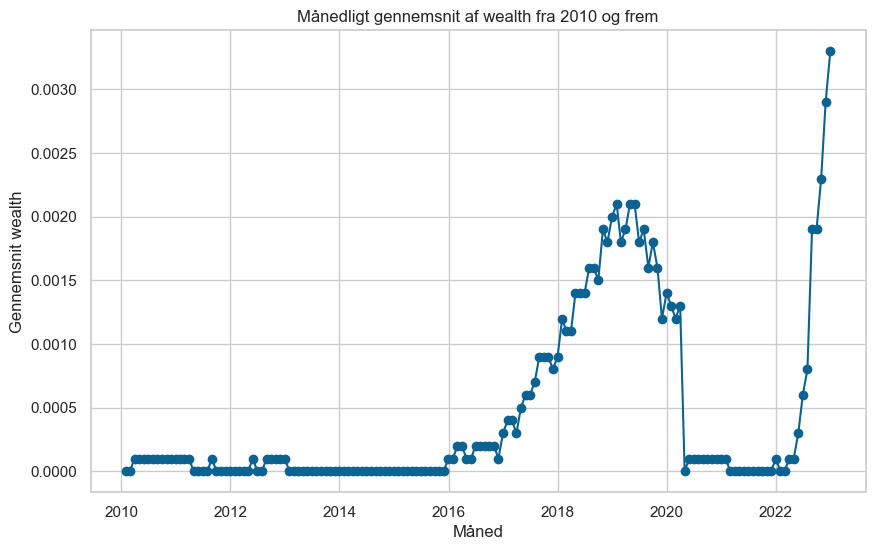

In [47]:
risk_free_2010 = risk_free[risk_free['eom'].dt.year >= 2010].copy()

# --- Samlet tidsserieplot for månedlige gennemsnit ---
# Resample data til månedlig gennemsnit (her bruges kolonnen 'wealth', men du kan også bruge 'mu_ld1' eller andre)
monthly_avg = risk_free_2010.set_index('eom').resample('M').mean()

plt.figure(figsize=(10, 6))
plt.plot(monthly_avg.index, monthly_avg['rf'], marker='o', linestyle='-')
plt.xlabel('Måned')
plt.ylabel('Gennemsnit wealth')
plt.title('Månedligt gennemsnit af wealth fra 2010 og frem')
plt.grid(True)
plt.show()

In [48]:
risk_free

,eom,rf
0,1952-12-31,0.0016
1,1953-01-31,0.0016
2,1953-02-28,0.0014
3,1953-03-31,0.0018
4,1953-04-30,0.0016
...,...,...
836,2022-08-31,0.0019
837,2022-09-30,0.0019
838,2022-10-31,0.0023
839,2022-11-30,0.0029


In [49]:
np.mean(cov_list["2015-01-31"]["fct_cov"])

0.0008844253248822048

In [50]:
np.mean(cov_list["2021-02-28"]["fct_cov"])

0.0004838089264378366

In [95]:
def pfml_implement(data_tc, cov_list, lambda_list, risk_free, features, 
                   wealth, mu, gamma_rel, dates_full, dates_oos, lb, 
                   hp_years, rff_feat, scale, 
                   g_vec=None, p_vec=None, l_vec=None, orig_feat=None, iter=None, hps=None, balanced=None, seed=None):
    # Hyperparameter search
    if hps is None:
        start_time = time.time()
        hps = {}
        for g in g_vec:
            start_g = time.time()
            print(f"Processing g: {g}")
            # Step 1: Prepare data using pfml_input_fun
            pfml_input = pfml_input_fun(
                data_tc, wealth=wealth, mu=mu, dates=dates_full,
                lb=lb, scale=scale, risk_free=risk_free,
                cov_list=cov_list, lambda_list=lambda_list, gamma_rel=gamma_rel, iter=iter,
                features=features, balanced=balanced,
                rff_feat=rff_feat, p_max=max(p_vec), g=g, add_orig=orig_feat, seed=seed
            )
            print(f"pfml_input_fun took {time.time()-start_g:.2f} sec")
            
            # RFF weights
            rff_w = pfml_input['rff_w']
            # Inputs: get all desired features via pfml_feat_fun
            feat_all = pfml_feat_fun(p=max(p_vec), orig_feat=orig_feat)
            # Adjust pfml_input so that only the columns corresponding to feat_all remain.
            #pfml_input = adjust_pfml_input(pfml_input, feat_all)
            feat_all_converted = [feat_all.index(x) if isinstance(x, str) else x for x in feat_all]
            feat_all_converted = np.array(feat_all_converted, dtype=int)
            pfml_input = {
                "reals": {
                    date: {
                        "r_tilde": item["r_tilde"][feat_all_converted],
                        **{key: value.iloc[feat_all_converted, feat_all_converted]
                           if hasattr(value, 'iloc') else value[np.ix_(feat_all_converted, feat_all_converted)]
                           for key, value in item.items() if key != "r_tilde"}
                    }
                    for date, item in pfml_input["reals"].items()
                },
                "signal_t": {
                    date: matrix[:, feat_all_converted]
                    for date, matrix in pfml_input["signal_t"].items()
                }
            }

            # Coefficients
            pfml_hp_coef = pfml_search_coef(pfml_input, p_vec=p_vec, l_vec=l_vec, hp_years=hp_years, orig_feat=orig_feat)
            # Realized utility (validation)
            validation = pfml_hp_reals_fun(pfml_input, hp_coef=pfml_hp_coef, p_vec=p_vec, l_vec=l_vec, hp_years=hp_years, orig_feat=orig_feat)
            validation['g'] = g  # Add column 'g'
            
            # Find optimal aim portfolio
            aims = pfml_aims_fun(pfml_input, validation=validation, data_tc=data_tc, hp_coef=pfml_hp_coef, 
                                  hp_years=hp_years, dates_oos=dates_oos, l_vec=l_vec, orig_feat=orig_feat)
            elapsed_g = (time.time()-start_g)/60
            print(f"g: {g:.2f} took {elapsed_g:.2f} min")
            hps[str(g)] = {"aim_pfs_list": aims, "validation": validation, "rff_w": rff_w}
        total_elapsed = time.time()-start_time
        print(f"Total hyperparameter search took {total_elapsed:.2f} sec")
    
    print("hps after search:")
    print(hps)
    
    # Implement final portfolio
    # Combine all validation DataFrames from hps into one DataFrame.
    validation_list = [hps[g_key]['validation'] for g_key in hps]
    best_hps = pd.concat(validation_list, ignore_index=True)
    if 'rank' in best_hps.columns:
        best_hps = best_hps.drop(columns='rank')
    best_hps['rank'] = best_hps.groupby('eom_ret')['cum_obj'].rank(ascending=False, method='min')
    best_hps['eom_ret'] = pd.to_datetime(best_hps['eom_ret'])
    best_hps = best_hps[(best_hps['rank'] == 1) & (best_hps['eom_ret'].dt.month == 12)]
    
    # (Optional: Create a diagnostic plot here – omitted or commented out)
    # For example, using seaborn:
    # import seaborn as sns
    # import matplotlib.pyplot as plt
    # melt_df = best_hps.melt(id_vars=['eom_ret'], value_vars=['p', 'l', 'g'], var_name='param', value_name='value')
    # plt.figure(figsize=(10,6))
    # sns.scatterplot(data=melt_df, x='eom_ret', y='value', hue='param', alpha=0.5)
    # sns.lineplot(data=melt_df, x='eom_ret', y='value', hue='param')
    # plt.title("HP Range Check")
    # plt.show()
    
    # Aim portfolios: for each date in dates_oos
    best_hps_list = {}
    for d in dates_oos:
        d_ret = d + pd.offsets.MonthEnd(1)  # last day of next month
        oos_year = d_ret.year
        print("Processing aim portfolio for date:", d)
        # Filter best_hps for rows with hp_end equal to oos_year - 1
        best_hps_d = best_hps[best_hps['hp_end'] == (oos_year - 1)]
        if best_hps_d.empty:
            print(f"No best_hps found for year {oos_year-1}")
            continue
        best_row = best_hps_d.iloc[0]
        best_g = best_row['g']
        best_p = best_row['p']
        d_str = d.strftime('%Y-%m-%d')
        print("d_str",d_str)
        if str(best_g) not in hps or d_str not in hps[str(best_g)]["aim_pfs_list"]:
            print(f"No aim portfolio found for date {d_str} under best_g {best_g}")
            continue
        best_aim = hps[str(best_g)]["aim_pfs_list"][d_str]["aim_pf"]
        best_coef = hps[str(best_g)]["aim_pfs_list"][d_str]["coef"]
        best_hps_list[d_str] = {"g": best_g, "p": best_p, "aim": best_aim, "coef": best_coef}
    
    if len(best_hps_list) == 0:
        raise ValueError("No aim portfolios were generated!")
    
    aims_df = pd.concat([entry["aim"] for entry in best_hps_list.values()], ignore_index=True)
    
    # Final portfolio: select data_tc for dates in dates_oos and valid == True, then call pfml_w.
    w_data = data_tc[(data_tc['valid'] == True) & (data_tc['eom'].isin(dates_oos))]
    w_data = w_data[['id', 'eom', 'eom_ret', 'me', 'tr_ld1', 'valid']]
    w = pfml_w(w_data, dates=dates_oos, cov_list=cov_list, lambda_list=lambda_list, gamma_rel=gamma_rel, iter=iter, risk_free=risk_free, wealth=wealth, mu=mu, aims=aims_df)
    pf = General_Functions.pf_ts_fun(w, data=data_tc, wealth=wealth, gam=gamma_rel)
    pf['type'] = "Portfolio-ML"
    rff_w_list = {g: hps[str(g)]["rff_w"] for g in g_vec}
    return {"hps": hps, "best_hps": best_hps, "best_hps_list": best_hps_list, "aims": aims_df, "w": w, "pf": pf, "rff_w_list": rff_w_list}


# Fjern forkert data

In [ ]:
import matplotlib.pyplot as plt

# Antag at pfml_input er defineret, og vi arbejder med en specifik dato
# Vi henter den første (eller en ønsket) dato fra pfml_input["reals"]
date = list(pfml_input["reals"].keys())[232]
data = pfml_input["reals"][date]

# Ekstraher r_tilde og denom
r_tilde = data['r_tilde']
denom = data['denom']  # Denne er en pandas DataFrame

# Plot r_tilde som linjeplot
plt.figure(figsize=(10, 4))
plt.plot(r_tilde, marker='o')
plt.title(f"r_tilde values for date {date}")
plt.xlabel("Index")
plt.ylabel("r_tilde")
plt.grid(True)
plt.show()
denom_matrix = data['denom'].values  # Hvis 'denom' er en pandas DataFrame




In [ ]:
# Få en liste over nøglerne i 'pfml_input["reals"]'
keys = list(pfml_input["reals"].keys())

# Vælg nøglerne for den entry, du vil kopiere (source) og den, du vil overskrive (target)
key_source = keys[232]  # fx den dato, du ønsker at kopiere fra
key_target = keys[231]  # den entry, der skal overskrives

# Overskriv værdien for key_target med en kopi af værdien fra key_source
pfml_input["reals"][key_target] = pfml_input["reals"][key_source].copy()


In [54]:
import matplotlib.pyplot as plt

# Antag at pfml_input er defineret, og vi arbejder med en specifik dato
# Vi henter den første (eller en ønsket) dato fra pfml_input["reals"]
date = list(pfml_input["reals"].keys())[231]
data = pfml_input["reals"][date]

# Ekstraher r_tilde og denom
r_tilde = data['r_tilde']
denom = data['denom']  # Denne er en pandas DataFrame

# Plot r_tilde som linjeplot
plt.figure(figsize=(10, 4))
plt.plot(r_tilde, marker='o')
plt.title(f"r_tilde values for date {date}")
plt.xlabel("Index")
plt.ylabel("r_tilde")
plt.grid(True)
plt.show()
denom_matrix = data['denom'].values  # Hvis 'denom' er en pandas DataFrame




NameError: name 'pfml_input' is not defined

In [ ]:
denom_matrix = data['denom'].values  # Hvis 'denom' er en pandas DataFrame

# 1. Histogram over alle værdier
plt.figure(figsize=(10, 4))
plt.hist(denom_matrix.flatten(), bins=6)
plt.title(f"Distribution of values in 'denom' {date}")
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.show()


In [ ]:
eigenvalues, _ = np.linalg.eig(denom_matrix)
# Vi sorterer egenværdierne efter deres reelle del
eigenvalues = np.sort(eigenvalues.real)
plt.figure(figsize=(10, 4))
plt.plot(eigenvalues, marker='o')
plt.title(f"Eigenvalue spectrum of 'denom {date}'")
plt.xlabel("Index")
plt.ylabel("Eigenvalue")
plt.show()

# Kør den store

In [96]:
def pfml_w(data, dates, cov_list, lambda_list, gamma_rel, iter, risk_free, wealth, mu, aims):

    fa_weights = General_Functions.initial_weights_new(data, w_type="vw")
    # Merge med de kolonner, der er nødvendige fra data (f.eks. 'tr_ld1')
    fa_weights = pd.merge(fa_weights, data[['id', 'eom', 'tr_ld1']], on=['id', 'eom'], how='left')
    # Merge med wealth for at få 'mu_ld1'
    fa_weights = pd.merge(fa_weights, wealth[['eom', 'mu_ld1']], on='eom', how='left')

    # --- For hver dato i dates: beregn m og opdater vægtene ---
    for d in dates:
        # d er en streng (f.eks. 'YYYY-MM-DD')
        # Opret datoen som pd.Timestamp for sammenligning
        d_ts = pd.to_datetime(d)
        # Hent ids for observationer i data for denne dato
        ids = data[data['eom'] == d]['id'].unique().astype(str).tolist()
        d_str = d.strftime('%Y-%m-%d')
 #       print("d_str")
 #       print(d_str)
        # Opret sigma og lambda for de givne ids. Her antages, at cov_list og lambda_list benyttes med nøglen d.
        # Vi konverterer nøglen til pd.Timestamp for at matche, hvis nødvendigt.
       # sigma = General_Functions.create_cov(cov_list[pd.to_datetime(d)], ids=ids)
        #sigma = General_Functions.create_cov(cov_list[d.strftime('%Y-%m-%d')], ids=ids)  # rettet her sidste # har virket
        sigma = General_Functions.create_cov(cov_list[d_str], ids=ids)
        lambda_series = pd.Series(lambda_list[d_str])
        lambda_series.index = lambda_series.index.astype(str)
        lam = create_lambda(lambda_series, ids=ids)
        w = wealth[wealth['eom'] == d]['wealth'].iloc[0]
        rf_val = risk_free[risk_free['eom'] == d]['rf'].iloc[0]
        m =portfolio_choice_functions.m_func(w=w, mu=mu, rf=rf_val, sigma_gam=sigma * gamma_rel, gam=gamma_rel,
           lambda_mat=lam, iter=iter)

        iden = np.eye(m.shape[0])
        
        w_cur = pd.merge(fa_weights[fa_weights['eom'] == d], aims, on=['id', 'eom'], how='left')
        w_cur['w_opt'] = (m @ w_cur['w_start'].values) + ((iden - m) @ w_cur['w_aim'].values)

        try:
            current_index = dates.get_loc(d)
            next_month = dates[current_index + 1]
            next_month_str = next_month.strftime('%Y-%m-%d')
            next_month = next_month_str
        except IndexError:
            next_month = None

           # Beregn w_opt_ld1 = w_opt * (1 + tr_ld1) / (1 + mu_ld1)
        w_cur['w_opt_ld1'] = w_cur['w_opt'] * (1 + w_cur['tr_ld1']) / (1 + w_cur['mu_ld1'])
        #print(w_cur.dtypes)

        fa_weights = pd.merge(w_cur[['id', 'w_opt', 'w_opt_ld1', 'eom']], 
                              fa_weights, on=['id', 'eom'], how='right')

        mask_current = (fa_weights['eom'] == d) & (fa_weights['w_opt'].notna())
        fa_weights.loc[mask_current, 'w'] = fa_weights.loc[mask_current, 'w_opt']
        #print("fa_weights 2")        
        #print(fa_weights)
        
        # For rækker med eom == next_month, sæt w_start til w_opt_ld1
        if next_month is not None:
            # Lav en kopi af w_cur og opdater 'eom' til next_month
            w_cur_next = w_cur.copy()
            w_cur_next['eom'] = pd.to_datetime(next_month)
            
            # Hvis der skulle være dubletter, kan du evt. fjerne dem
            w_cur_next = w_cur_next.drop_duplicates(subset=['id', 'eom'])
            
            # Merge med fa_weights (her kan du vælge left join, hvis fa_weights skal være basen)
            merged = pd.merge(fa_weights, 
                              w_cur_next[['id', 'w_opt_ld1', 'eom']], 
                              on=['id', 'eom'], 
                              how='left', 
                              suffixes=('', '_next'))
            
            # Tæl antallet af matches pr. (id, eom) – her tæller vi, om vi fandt en match for next_month
            merged['match_count'] = merged.groupby(['id', 'eom'])['w_opt_ld1_next'].transform(lambda x: x.notna().sum())
            
            # Gem original w_start for at kunne se ændringen
            merged['w_start_orig'] = merged['w_start']
            
            # Hvis vi har en match (og altså en værdi i w_opt_ld1_next), opdater w_start
            mask_next = (merged['eom'] == pd.to_datetime(next_month)) & (merged['w_opt_ld1_next'].notna())
            merged.loc[mask_next, 'w_start'] = merged.loc[mask_next, 'w_opt_ld1_next']
            
            # Hvis w_start stadig er NaN for next_month, sæt den til 0
            mask_next_na = (merged['eom'] == pd.to_datetime(next_month)) & (merged['w_start'].isna())
            merged.loc[mask_next_na, 'w_start'] = 0
            
            # Beregn forskellen mellem den opdaterede w_start og den oprindelige værdi
            merged['w_start_diff'] = merged['w_start'] - merged['w_start_orig']
            
            # Fjern hjælpekolonner, hvis de ikke skal bruges
            merged.drop(columns=['w_opt_ld1_next', 'w_start_orig'], inplace=True)
            
            # Hvis du ønsker at se resultatet, kan du til sidst sætte fa_weights til merged
            fa_weights = merged
        
        # Til sidst fjernes de ikke ønskede kolonner
        fa_weights.drop(columns=['w_opt', 'w_opt_ld1'], inplace=True)
        

    
    return fa_weights

In [49]:
aims_df

NameError: name 'aims_df' is not defined

In [50]:
df_grouped = aims_df.groupby('eom')['w_aim'].sum().reset_index()
df_grouped

NameError: name 'aims_df' is not defined

In [183]:
abs_sum_df

,eom,abs_sum
0,2010-12-31,0.837463
1,2011-01-31,0.823886
2,2011-02-28,0.839756
3,2011-03-31,0.798369
4,2011-04-30,0.827293
...,...,...
139,2022-07-31,0.010257
140,2022-08-31,0.010201
141,2022-09-30,0.010746
142,2022-10-31,0.010223


In [396]:
risk_free

,eom,rf
0,1952-12-31,0.0016
1,1953-01-31,0.0016
2,1953-02-28,0.0014
3,1953-03-31,0.0018
4,1953-04-30,0.0016
...,...,...
836,2022-08-31,0.0019
837,2022-09-30,0.0019
838,2022-10-31,0.0023
839,2022-11-30,0.0029


In [60]:
import matplotlib.pyplot as plt
df_grouped = aims_df.groupby('eom')['w_aim'].sum().reset_index()
abs_sum_df = aims_df.groupby('eom')['w_aim'].apply(lambda x: x.abs().sum()).reset_index(name='abs_sum')
# Convert eom to datetime
abs_sum_df['eom'] = pd.to_datetime(df_grouped['eom'])
# Create plot
plt.figure(figsize=(10,6))
plt.plot(abs_sum_df['eom'], abs_sum_df['abs_sum'])
plt.xlabel('Dato')
plt.ylabel('Samlet vægt')
plt.title('Samlet vægt over tid')
plt.show()

NameError: name 'aims_df' is not defined

In [96]:
barra_cov[date]["fct_cov"].corr().shape

(25, 25)

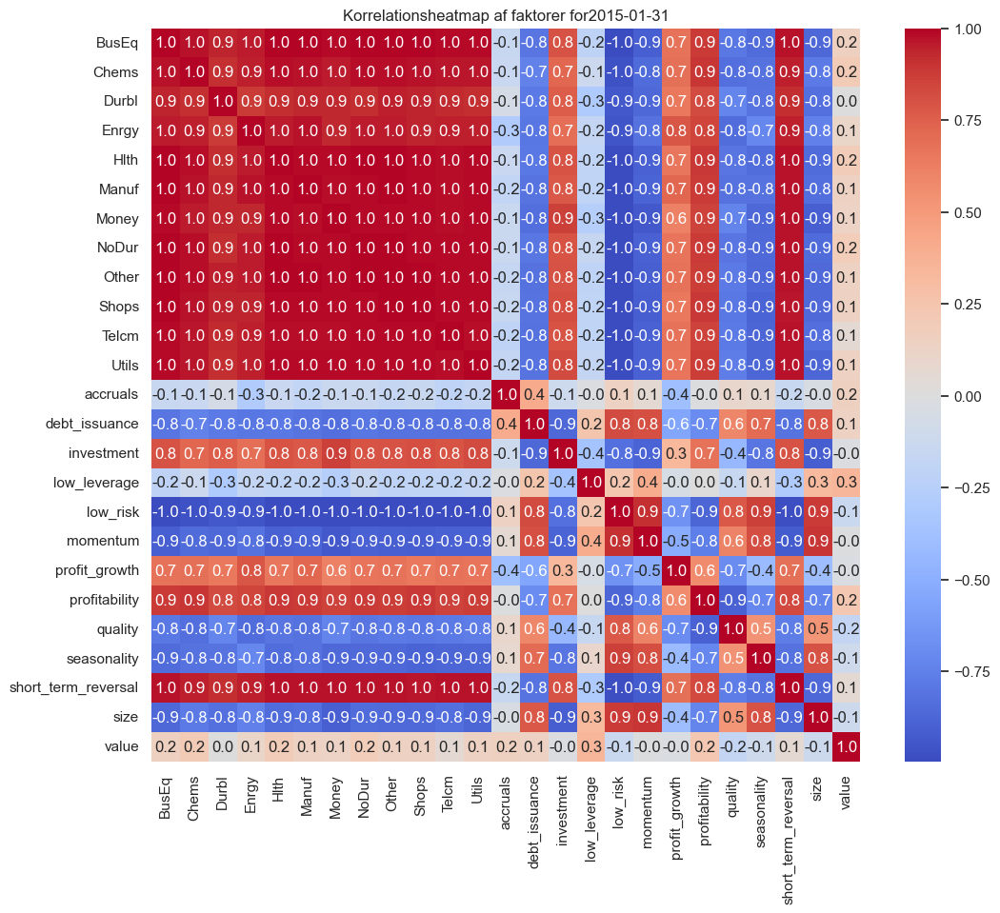

In [106]:
date = "2015-01-31"

plt.figure(figsize=(12,10))
sns.heatmap(barra_cov[date]["fct_cov"].corr(), annot=True, cmap='coolwarm', fmt='.1f')
plt.title(f'Korrelationsheatmap af faktorer for{date}')
plt.show()

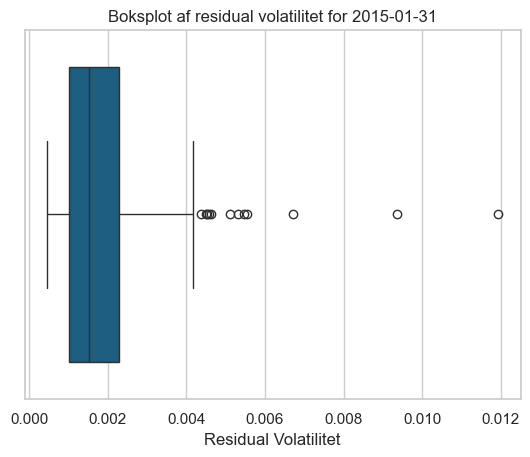

In [107]:
sns.boxplot(x=barra_cov[date]["ivol_vec"])
plt.title(f'Boksplot af residual volatilitet for {date}')
plt.xlabel('Residual Volatilitet')
plt.show()


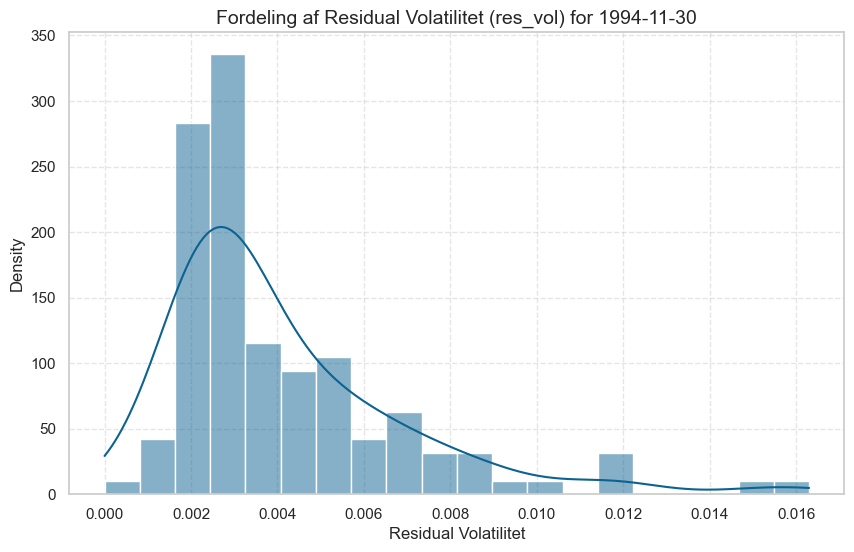

In [104]:
plt.figure(figsize=(10, 6))
sns.histplot(res_vol, bins=20, kde=True, stat="density")  # <-- stat="density"
plt.title(f'Fordeling af Residual Volatilitet (res_vol) for {date}', fontsize=14)
plt.xlabel('Residual Volatilitet')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


In [105]:
barra_cov[date]["ivol_vec"].shape

(117,)

In [401]:
w_filtered = w[w['id'] == 10104]
print(w_filtered)


        id        eom   w_start         w    tr_ld1    mu_ld1
0    10104 2010-12-31  0.019620  0.005114  0.024954  0.020052
1    10104 2011-01-31  0.005138 -0.002645  0.027140  0.038821
2    10104 2011-02-28 -0.002615 -0.007019  0.016218  0.003383
3    10104 2011-03-31 -0.007109 -0.008948  0.077442  0.027662
4    10104 2011-04-30 -0.009382 -0.011255 -0.048400 -0.015071
..     ...        ...       ...       ...       ...       ...
139  10104 2022-07-31       NaN       NaN -0.048506 -0.036188
140  10104 2022-08-31       NaN       NaN -0.176428 -0.091370
141  10104 2022-09-30       NaN       NaN  0.283182  0.081350
142  10104 2022-10-31       NaN       NaN  0.062977  0.051329
143  10104 2022-11-30       NaN       NaN -0.016016 -0.059779

[144 rows x 6 columns]


In [88]:
# Antag, at følgende variable allerede er defineret:
# w_data, dates_oos, cov_list, lambda_list, gamma_rel, iter, risk_free, wealth, mu, aims_df

import pandas as pd
import numpy as np

variables = {
    "w_data": w_data,
    "dates_oos": dates_oos,
    "cov_list": cov_list,
    "lambda_list": lambda_list,
    "gamma_rel": gamma_rel,
    "iter": iter,
    "risk_free": risk_free,
    "wealth": wealth,
    "mu": mu,
    "aims_df": aims_df,
}

for name, var in variables.items():
    # Print variable name and type
    print(f"{name}: type = {type(var)}", end=", ")
    # Hvis variablen er en DataFrame eller NumPy-array, printer vi dens shape.
    if isinstance(var, pd.DataFrame) or isinstance(var, np.ndarray):
        print(f"shape = {var.shape}")
    # Hvis variablen er en liste, tuple eller dict, printer vi dens længde.
    elif isinstance(var, (list, tuple, dict)):
        print(f"length = {len(var)}")
    # For andre typer (fx scalars) printer vi bare typen.
    else:
        print()


NameError: name 'w_data' is not defined

In [76]:

    w_data = chars[(chars['valid'] == True) & (chars['eom'].isin(dates_oos))]
    w_data = w_data[['id', 'eom', 'eom_ret', 'me', 'tr_ld1', 'valid']]

In [187]:
chars["pred_ld1"]

0             NaN
1             NaN
2             NaN
3             NaN
4             NaN
           ...   
73211    0.010957
73212    0.009506
73213    0.010641
73214    0.010774
73215    0.011608
Name: pred_ld1, Length: 73216, dtype: float64

In [ ]:
import warnings
warnings.filterwarnings('ignore')

# Antag at gamma_rel er en liste med gamma-værdier, f.eks.:
gamma_rel_list = settings['pf_ml'].get('gamma_rel_list', [1, 2, 3, 4, 5, 10, 50])

for gamma in gamma_rel_list:
    print(f"Processing gamma: {gamma}")
    start_time = time.time()
    
    pfml_result = pfml_implement(
        data_tc=chars,            # Forventet at være en pandas DataFrame
        cov_list=barra_cov,       # Dictionary med kovariansmatricer
        lambda_list=lambda_list,  # Liste eller dictionary med lambda-værdier
        features=features,        # Liste over feature-navne
        risk_free=risk_free,      # Forventet at være en DataFrame med risikofri rente
        wealth=wealth,            # Forventet at være en DataFrame med formue
        mu=pf_set['mu'],          # Forventet afkast, fx fra pf_set
        gamma_rel=gamma,          # Sætter den aktuelle gamma-værdi
        dates_full=dates_m2,      # Fulde datoer (som en liste eller pd.Series)
        dates_oos=dates_oos,      # Out-of-sample datoer (som en liste eller pd.Series)
        lb=pf_set['lb_hor'],      # Lookback horisont
        hp_years=hp_years,        # HP-år (f.eks. de år, hvor hyperparameter-søgningen foretages)
        rff_feat=True,
        g_vec=settings['pf_ml']['g_vec'],
        p_vec=settings['pf_ml']['p_vec'],
        l_vec=settings['pf_ml']['l_vec'],
        scale=settings['pf_ml']['scale'],
        orig_feat=settings['pf_ml']['orig_feat'],
        iter=10,
        hps=None,
        balanced=False,
        seed=10                 # Eller settings['seed_no']
    )
    
    elapsed = time.time() - start_time
    print(f"Processing for gamma {gamma} took {elapsed:.2f} sec")
    
    # Gem resultatet til en pickle-fil med navnet pfml_seed_10_gamma_{gamma}.pkl
    filename = f"pfml_seed_10_gamma_{gamma}.pkl"
    with open(filename, "wb") as f:
        pickle.dump(pfml_result, f)
    print(f"Saved result to {filename}\n")

Processing gamma: 1
Processing g: 0.049787068367863944
m_func: n = 120
m_func: n = 121
m_func: n = 124
m_func: n = 124
m_func: n = 124
m_func: n = 127
m_func: n = 127
m_func: n = 129
m_func: n = 129
m_func: n = 129
m_func: n = 130
m_func: n = 130
m_func: n = 130
m_func: n = 130
m_func: n = 130
m_func: n = 130
m_func: n = 130
m_func: n = 130
m_func: n = 130
m_func: n = 130
m_func: n = 130
m_func: n = 130
m_func: n = 133
m_func: n = 134
m_func: n = 134
m_func: n = 135
m_func: n = 135
m_func: n = 135
m_func: n = 135
m_func: n = 135
m_func: n = 136
m_func: n = 136
m_func: n = 137
m_func: n = 137


In [100]:
import warnings
warnings.filterwarnings('ignore')
pfml = pfml_implement(
    data_tc=chars, #rigtig
    cov_list=barra_cov, #rigtig
    lambda_list=lambda_list, #rigtig
    features=features, #rigtig
    risk_free=risk_free, # forkert
    wealth=wealth, # forkert
    mu=pf_set['mu'], #rigtig
    gamma_rel= 10, #pf_set['gamma_rel'], #rigtig
    dates_full=dates_m2,
    dates_oos=dates_oos,  # forkert
    lb=pf_set['lb_hor'], # rigtig
    hp_years=hp_years, # forkert
    rff_feat=True, #rigtig
    g_vec=settings['pf_ml']['g_vec'], # rigtig #0.049787068367863944
    p_vec=settings['pf_ml']['p_vec'], # rigtig
    l_vec=settings['pf_ml']['l_vec'], # rigtig
    scale=settings['pf_ml']['scale'], # rigtig
    orig_feat=settings['pf_ml']['orig_feat'], #rigtig
    iter=10,                # rigtig
    hps=None,          #rigtig
    balanced=False,
    seed= 10 # settings['seed_no'] #rigtig
)

Processing g: 0.049787068367863944
pfml_input_fun took 1251.27 sec
g: 0.05 took 21.50 min
Processing g: 0.1353352832366127
pfml_input_fun took 1145.93 sec
g: 0.14 took 19.74 min
Total hyperparameter search took 2474.67 sec
hps after search:
{'0.049787068367863944': {'aim_pfs_list': {'2010-12-31': {'aim_pf':            id        eom     w_aim
288     10104 2010-12-31 -0.003901
720     10107 2010-12-31 -0.001614
1148    10138 2010-12-31 -0.002010
1628    10145 2010-12-31  0.000007
2108    10516 2010-12-31  0.001979
...       ...        ...       ...
123477  87432 2010-12-31 -0.000095
123745  87447 2010-12-31  0.000750
124153  87717 2010-12-31  0.000079
124592  91556 2010-12-31  0.009138
125014  92655 2010-12-31  0.002288

[308 rows x 3 columns], 'coef': array([ 2.15491681e-04, -7.22393742e-05,  5.67149188e-05, -1.71070270e-04,
        2.19496982e-05,  2.29585871e-04,  3.32102187e-05, -1.58475950e-04,
       -4.76491079e-05, -4.00619360e-05,  1.30558298e-04, -2.43789115e-05,
       -1.376

In [300]:
# Gem pickle fil

In [51]:
new_filename = "pfml_seed_10_uden_standarlisering.pkl"
with open(new_filename, "wb") as f:
    pickle.dump(pfml, f)

In [101]:
pfml

{'hps': {'0.049787068367863944': {'aim_pfs_list': {'2010-12-31': {'aim_pf':            id        eom     w_aim
     288     10104 2010-12-31 -0.003901
     720     10107 2010-12-31 -0.001614
     1148    10138 2010-12-31 -0.002010
     1628    10145 2010-12-31  0.000007
     2108    10516 2010-12-31  0.001979
     ...       ...        ...       ...
     123477  87432 2010-12-31 -0.000095
     123745  87447 2010-12-31  0.000750
     124153  87717 2010-12-31  0.000079
     124592  91556 2010-12-31  0.009138
     125014  92655 2010-12-31  0.002288
     
     [308 rows x 3 columns],
     'coef': array([ 2.15491681e-04, -7.22393742e-05,  5.67149188e-05, -1.71070270e-04,
             2.19496982e-05,  2.29585871e-04,  3.32102187e-05, -1.58475950e-04,
            -4.76491079e-05, -4.00619360e-05,  1.30558298e-04, -2.43789115e-05,
            -1.37652214e-04, -1.62769454e-04,  1.31463488e-04, -2.10110668e-04,
             4.90578593e-05, -1.41082681e-05,  8.36184126e-05, -5.81406880e-06,
      

In [54]:
hps = None
balanced = True

In [260]:
rff_w

array([[ 0.59756326, -0.48276209,  0.0892731 , ..., -0.25218821,
        -0.38987528,  0.18981823],
       [-0.22505261, -0.01423528,  0.07424917, ..., -0.10799127,
        -0.23999586,  0.00840081],
       [-0.19430353, -0.59440943,  0.24317577, ...,  0.19580454,
         0.25586336, -0.18318385],
       ...,
       [ 0.31128511, -0.07314836, -0.16268706, ..., -0.14840382,
         0.06233792, -0.52086906],
       [-0.31619824, -0.25766221,  0.11901906, ...,  0.04606744,
         0.22421165, -0.41069957],
       [ 0.12895866, -0.07482464, -0.04046361, ...,  0.08419517,
         0.62127438, -0.19966845]])

In [263]:
rff_w.shape

(115, 256)

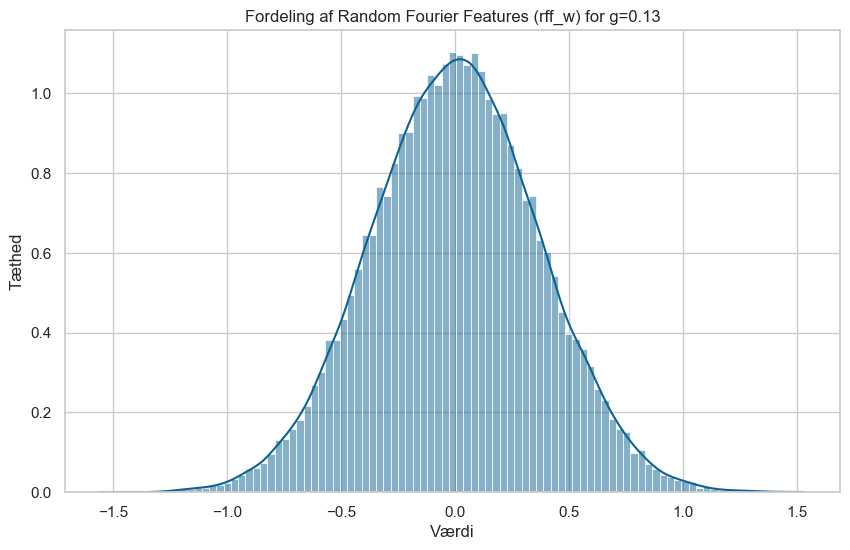

In [278]:
values = rff_w_list[0.1353352832366127].flatten()

plt.figure(figsize=(10,6))
sns.histplot(values, kde=True, stat="density")
plt.title("Fordeling af Random Fourier Features (rff_w) for g=0.13")
plt.xlabel("Værdi")
plt.ylabel("Tæthed")
plt.show()


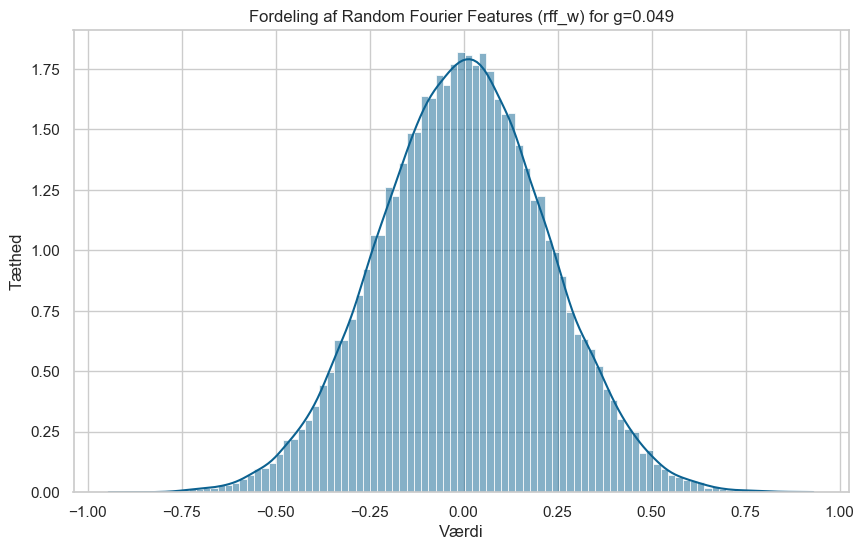

In [280]:
values = rff_w_list[0.049787068367863944].flatten()

plt.figure(figsize=(10,6))
sns.histplot(values, kde=True, stat="density")
plt.title("Fordeling af Random Fourier Features (rff_w) for g=0.049")
plt.xlabel("Værdi")
plt.ylabel("Tæthed")
plt.show()


In [ ]:
# Plot over bedste g over tid

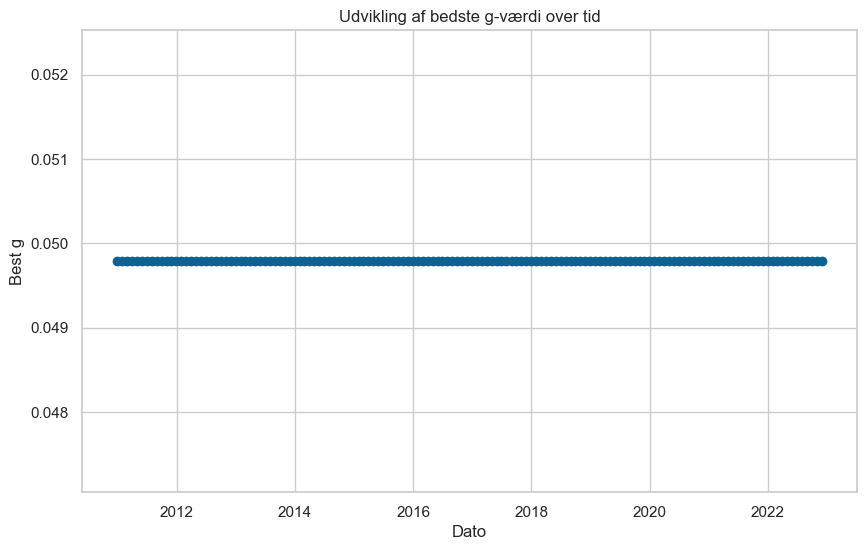

In [60]:
data = []
for date_str, info in pfml["best_hps_list"].items():
    data.append({"date": pd.to_datetime(date_str), "g": info["g"]})
df = pd.DataFrame(data).sort_values("date")

plt.figure(figsize=(10,6))
plt.plot(df["date"], df["g"], marker='o', linestyle='-')
plt.xlabel("Dato")
plt.ylabel("Best g")
plt.title("Udvikling af bedste g-værdi over tid")
plt.show()

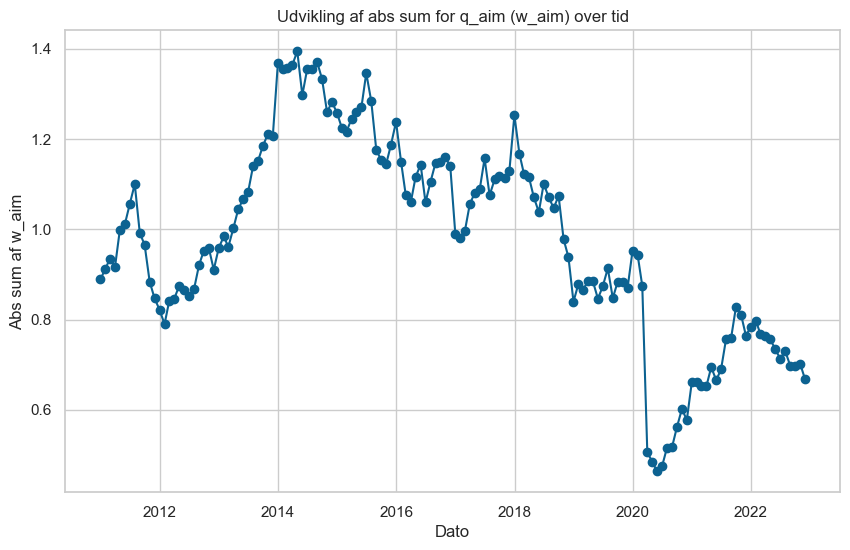

In [61]:
data = []
for date_str, info in pfml["best_hps_list"].items():
    # Sørg for at "aim" er en DataFrame med kolonnen "w_aim"
    df = info["aim"]
    abs_sum = df["w_aim"].abs().sum()
    data.append({"date": pd.to_datetime(date_str), "abs_sum": abs_sum})

df_plot = pd.DataFrame(data).sort_values("date")

plt.figure(figsize=(10,6))
plt.plot(df_plot["date"], df_plot["abs_sum"], marker='o', linestyle='-')
plt.xlabel("Dato")
plt.ylabel("Abs sum af w_aim")
plt.title("Udvikling af abs sum for q_aim (w_aim) over tid")
plt.show()

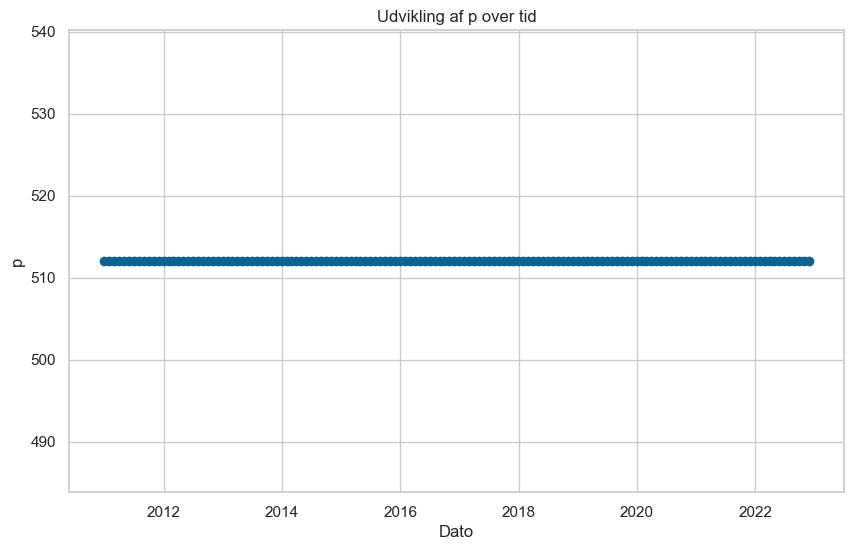

In [62]:
data = []
for date_str, info in pfml["best_hps_list"].items():
    # Antag at 'p' er et enkelt tal i info
    p_value = info["p"]
    data.append({"date": pd.to_datetime(date_str), "p": p_value})

df_plot = pd.DataFrame(data).sort_values("date")

plt.figure(figsize=(10,6))
plt.plot(df_plot["date"], df_plot["p"], marker='o', linestyle='-')
plt.xlabel("Dato")
plt.ylabel("p")
plt.title("Udvikling af p over tid")
plt.show()

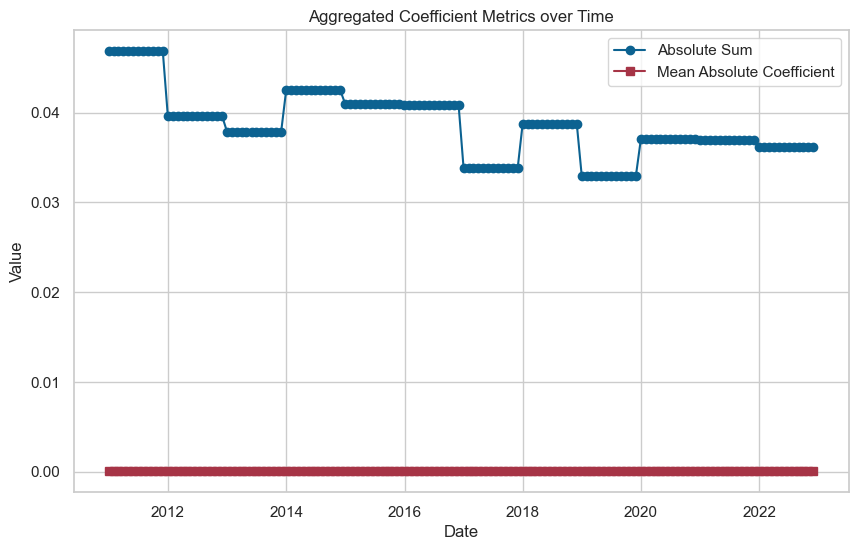

In [63]:
data = []
for date_str, info in pfml["best_hps_list"].items():
    coef = info["coef"]
    # Konverter evt. til pandas Series, hvis det er en numpy-array
    coef_series = pd.Series(coef)
    abs_sum = coef_series.abs().sum()
    mean_abs = coef_series.abs().mean()
    data.append({"date": pd.to_datetime(date_str), "abs_sum": abs_sum, "mean_abs": mean_abs})

df_plot = pd.DataFrame(data).sort_values("date")

plt.figure(figsize=(10,6))
plt.plot(df_plot["date"], df_plot["abs_sum"], marker='o', linestyle='-', label="Absolute Sum")
plt.plot(df_plot["date"], df_plot["mean_abs"], marker='s', linestyle='-', label="Mean Absolute Coefficient")
plt.xlabel("Date")
plt.ylabel("Value")
plt.title("Aggregated Coefficient Metrics over Time")
plt.legend()
plt.show()

In [102]:
bm_pfs = pd.concat(
    [tpf["pf"], factor_ml["pf"], ew["pf"], mkt["pf"], rw["pf"], mv["pf"], static["pf"], pfml["pf"]],
    ignore_index=True
)
#bm_pfs.to_csv(f"{output_path}/bms.csv", index=False)

In [103]:
# Konverter eom_ret til dato
bm_pfs['eom_ret'] = pd.to_datetime(bm_pfs['eom_ret'])

# Erstat "Rank-Weighted" med "Rank-ML" i kolonnen type
bm_pfs.loc[bm_pfs['type'] == 'Rank-Weighted', 'type'] = 'Rank-ML'

pfs = bm_pfs

In [104]:
for keys in pfml.keys():
    print(keys)

hps
best_hps
best_hps_list
aims
w
pf
rff_w_list


In [105]:
static_ml_star = pfs[pfs['type'] == "Static-ML*"]
static_ml_star

,inv,shorting,turnover,r,tc,eom_ret,type
864,0.651105,0.092097,0.618754,0.001498,0.001712,2011-01-31,Static-ML*
865,1.026054,0.195293,0.470223,0.022830,0.001150,2011-02-28,Static-ML*
866,0.945186,0.337876,0.494990,0.014153,0.001225,2011-03-31,Static-ML*
867,1.144492,0.353729,0.314216,0.032381,0.000514,2011-04-30,Static-ML*
868,1.217325,0.598111,0.575309,0.018766,0.001527,2011-05-31,Static-ML*
...,...,...,...,...,...,...,...
1003,2.499463,1.305545,0.611423,0.003735,0.002502,2022-08-31,Static-ML*
1004,2.817038,1.914241,0.927989,0.085236,0.007632,2022-09-30,Static-ML*
1005,2.687497,0.993258,1.722441,0.062004,0.022358,2022-10-31,Static-ML*
1006,2.713148,0.930988,0.401101,0.043808,0.001916,2022-11-30,Static-ML*


In [106]:
pfs = bm_pfs


subset_hps = static["hps"][
    static["hps"]["eom_ret"].isin(static["pf"]["eom_ret"]) &
    (static["hps"]["k"] == 1) &
    (static["hps"]["g"] == 0) &
    (static["hps"]["u"] == 1)
].copy()

subset_hps["eom_ret"] = pd.to_datetime(subset_hps["eom_ret"])
subset_hps = subset_hps[["eom_ret", "inv", "shorting", "turnover", "r", "tc"]]
subset_hps["type"] = "Static-ML"

pfs = pd.concat([   # Static-ML portefølje-tidsserie
    bm_pfs,         # Benchmark-porteføljer
    subset_hps      # Filtreret subset af static["hps"]
], ignore_index=True)

In [107]:

main_types = pf_order

# 3) Tildel factor-rækkefølgen og sorter
pfs['type'] = pd.Categorical(pfs['type'], categories=pf_order, ordered=True)
pfs = pfs.sort_values(by=['type', 'eom_ret'])

pfs['e_var_adj'] = pfs.groupby('type')['r'].transform(lambda x: (x - x.mean())**2)

# Beregn utility_t: r - tc - 0.5 * e_var_adj * gamma_rel (her antages pf_set være en dictionary)
pfs['utility_t'] = pfs['r'] - pfs['tc'] - 0.5 * pfs['e_var_adj'] * pf_set['gamma_rel']

# Portfolio summary stats --------------
def summary_stats(group):
    n = group.shape[0]
    inv = group['inv'].mean()
    shorting = group['shorting'].mean()
    turnover_notional = group['turnover'].mean()
    r_mean = group['r'].mean() * 12
    sd = group['r'].std() * np.sqrt(12)
    sr_gross = (group['r'].mean()/group['r'].std() * np.sqrt(12)) if group['r'].std() != 0 else np.nan
    tc = group['tc'].mean() * 12
    r_tc = (group['r'] - group['tc']).mean() * 12
    sr = ((group['r'] - group['tc']).mean()/group['r'].std() * np.sqrt(12)) if group['r'].std() != 0 else np.nan
    obj = (group['r'].mean() - 0.5 * group['r'].var() * pf_set['gamma_rel'] - group['tc'].mean()) * 12
    return pd.Series({
        'n': n,
        'inv': inv,
        'shorting': shorting,
        'turnover_notional': turnover_notional,
        'r': r_mean,
        'sd': sd,
        'sr_gross': sr_gross,
        'tc': tc,
        'r_tc': r_tc,
        'sr': sr,
        'obj': obj
    })

pf_summary = pfs.groupby('type').apply(summary_stats).reset_index()
pf_summary = pf_summary.sort_values(by='type')

# Fjern ikke-essentielle typer (hvis nødvendigt)
pfs = pfs[pfs['type'].isin(main_types)].copy()
pfs['type'] = pd.Categorical(pfs['type'], categories=main_types, ordered=True)

# Udskriv resuméet
print(pf_summary)


gamma_rel = pf_set["gamma_rel"]  

# Beregn portefølje-sammenfatningsstatistikker
pf_summary = pfs.groupby("type").agg(
    n=("eom_ret", "count"),  # Antal observationer
    inv=("inv", "mean"),  # Gennemsnitlig investering
    shorting=("shorting", "mean"),  # Gennemsnitlig shorting
    turnover_notional=("turnover", "mean"),  # Gennemsnitlig omsætning (turnover)
    r=("r", lambda x: x.mean() * 12),  # Gennemsnitligt afkast annualiseret
    sd=("r", lambda x: x.std() * (12**0.5)),  # Volatilitet annualiseret
    sr_gross=("r", lambda x: x.mean() / x.std() * (12**0.5) if x.std() > 0 else None),  # Sharpe Ratio før transaktionsomkostninger
    tc=("tc", lambda x: x.mean() * 12),  # Gennemsnitlige transaktionsomkostninger annualiseret
    r_tc=("r", lambda x: (x - pfs.loc[x.index, "tc"]).mean() * 12),  # Nettoafkast efter transaktionsomkostninger
    sr=("r", lambda x: (x - pfs.loc[x.index, "tc"]).mean() / x.std() * (12**0.5) if x.std() > 0 else None),  # Sharpe Ratio efter transaktionsomkostninger
    obj=("r", lambda x: (x.mean() - 0.5 * x.var() * gamma_rel - pfs.loc[x.index, "tc"].mean()) * 12)  # Optimeringsmål
).reset_index()

# Sorter efter type
pf_summary = pf_summary.sort_values(by="type")

# Filtrer pfs til kun at inkludere de relevante typer (main_types skal defineres)
pfs = pfs[pfs["type"].isin(main_types)]
pfs["type"] = pd.Categorical(pfs["type"], categories=main_types, ordered=True)

# Vis resultatet
from IPython.display import display
display(pf_summary)

                    type    n  inv  shorting  turnover_notional   r  sd  \
0    Portfolio-ML_gamma1  0.0  NaN       NaN                NaN NaN NaN   
1    Portfolio-ML_gamma5  0.0  NaN       NaN                NaN NaN NaN   
2   Portfolio-ML_gamma10  0.0  NaN       NaN                NaN NaN NaN   
3   Portfolio-ML_gamma20  0.0  NaN       NaN                NaN NaN NaN   
4  Portfolio-ML_gamma100  0.0  NaN       NaN                NaN NaN NaN   

   sr_gross  tc  r_tc  sr  obj  
0       NaN NaN   NaN NaN  NaN  
1       NaN NaN   NaN NaN  NaN  
2       NaN NaN   NaN NaN  NaN  
3       NaN NaN   NaN NaN  NaN  
4       NaN NaN   NaN NaN  NaN  


,type,n,inv,shorting,turnover_notional,r,sd,sr_gross,tc,r_tc,sr,obj
0,Portfolio-ML_gamma1,0,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,None,NaN
1,Portfolio-ML_gamma5,0,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,None,NaN
2,Portfolio-ML_gamma10,0,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,None,NaN
3,Portfolio-ML_gamma20,0,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,None,NaN
4,Portfolio-ML_gamma100,0,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,None,NaN


# Feature importance

In [316]:
def pfml_cf_fun(data, cf_cluster, pfml_base, dates, cov_list, scale, orig_feat, gamma_rel, 
                wealth, risk_free, mu, iter_, seed, features, lambda_list, dates_oos, cluster_labels):
    """
    Portefølje-ML counterfactual funktion.
    
    Parametre:
      cf_cluster : Navn på den cluster, der skal benyttes (fx "quality", "value", etc.).
      pfml_base  : Objekt (f.eks. et dictionary) med en Portfolio-ML base, der indeholder best_hps_list og hps.
      cov_list   : Dictionary med kovariansmatricer (nøgler som datoer).
      scale      : Bool, om skalering skal udføres.
      orig_feat  : Bool, om originale features skal medtages.
      gamma_rel  : Den aktuelle gamma-værdi.
      cluster_labels : pandas DataFrame med kolonnerne "cluster" og "characteristic".
      
    Returnerer:
      pf_cf : En pandas DataFrame med den counterfactual portefølje for cf_cluster.
    """
    np.random.seed(seed)
    
    # Hvis scale: byg en 'scales'-tabel for hver dato
    if scale:
        scales_list = []
        for d in dates:
            # Her antages cov_list er en dictionary med nøgler, der kan konverteres til str(d)
            sigma = create_cov(cov_list[str(d)])  # create_cov skal være defineret
            # Forvent, at sigma er en pandas DataFrame med index som 'id'
            diag_vol = np.sqrt(np.diag(sigma))
            df_scales = pd.DataFrame({
                'id': sigma.index.astype(float),
                'eom': pd.to_datetime(d),
                'vol_scale': diag_vol
            })
            scales_list.append(df_scales)
        scales_df = pd.concat(scales_list, ignore_index=True)
        # Merge med data (forudsætter at 'id' og 'eom' eksisterer)
        data = pd.merge(data, scales_df, on=['id', 'eom'], how='left')
        # Imputer manglende vol_scale med median pr. eom
        data['vol_scale'] = data.groupby('eom')['vol_scale'].transform(lambda x: x.fillna(x.median()))
    
    # Lav counterfactual data (cf) med udvalgte kolonner
    cf = data[['id', 'eom', 'vol_scale'] + features].copy()
    
    if cf_cluster != "bm":
        # Shuffle id'er inden for hver eom for at få reproducerbarhed
        cf = cf.groupby('eom', group_keys=False).apply(lambda df: df.assign(id_shuffle=np.random.permutation(df['id'])))
        # Udvælg karakteristika for cf_cluster fra cluster_labels
        chars_sub = cluster_labels.loc[cluster_labels['cluster'] == cf_cluster, 'characteristic'].tolist()
        # Vælg de relevante kolonner og omdøb 'id' til 'id_shuffle'
        chars_data = cf[['id', 'eom'] + chars_sub].rename(columns={'id': 'id_shuffle'})
        # Merge chars_data tilbage i cf (fjern kolonnerne med chars_sub i cf før merge)
        cf = pd.merge(cf.drop(columns=chars_sub), chars_data, on=['id_shuffle', 'eom'], how='left')
    
    # Beregn counterfactual aim portfolio for hver dato i 'dates'
    aim_cf_list = []
    for d in dates:
        # Filtrer cf for dato d
        cf_d = cf[pd.to_datetime(cf['eom']) == pd.to_datetime(d)]
        # Stocks er de aktuelle id'er
        stocks = cf_d['id'].tolist()
        # Hent base hyperparametre for dato d fra pfml_base
        best_hps = pfml_base['best_hps_list'][str(d)]
        best_g = best_hps['g']
        best_p = best_hps['p']
        aim_coef = best_hps['coef']  # Forventet som en numpy array
        # Hent rff-vægtene: antag pfml_base['hps'] er et dictionary med nøgler som str(best_g)
        W = pfml_base['hps'][str(best_g)]['rff_w'][:, :int(best_p/2)]
        
        # Beregn rff for cf_d for de givne features med W (forvent at rff returnerer en dict med 'X_cos' og 'X_sin')
        rff_x = rff(cf_d[features].values, p=None, g=None, W=W)
        # Kombiner X_cos og X_sin til signalmatrix
        s = np.hstack([rff_x['X_cos'], rff_x['X_sin']])
        # Opret DataFrame med passende kolonnenavne
        col_names = [f"rff{i}_cos" for i in range(1, int(best_p/2)+1)] + [f"rff{i}_sin" for i in range(1, int(best_p/2)+1)]
        s_df = pd.DataFrame(s, columns=col_names, index=cf_d.index)
        # Demean: træk kolonnegennemsnit fra hver kolonne
        s_df = s_df - s_df.mean()
        # Scale: multiplicer hver kolonne med sqrt(1/sum(x^2))
        s_df = s_df.apply(lambda x: x * np.sqrt(1 / np.sum(x**2)) if np.sum(x**2) != 0 else x)
        # Reorder kolonnerne, fx ved at kalde pfml_feat_fun (forvent, at den returnerer en liste med ønskede feature-navne)
        feat = pfml_feat_fun(best_p, orig_feat)
        s_df = s_df[feat]
        if scale:
            # Anvend skalering: multiplicer med diagonal matrix 1/vol_scale for cf_d
            scales_arr = np.diag(1 / cf_d['vol_scale'].values)
            s_df = pd.DataFrame(scales_arr @ s_df.values, columns=s_df.columns, index=s_df.index)
        # Beregn aim-vægten: w_aim = s_df dot aim_coef
        w_aim = s_df.values @ aim_coef
        cf_d = cf_d[['id', 'eom']].copy()
        cf_d['w_aim'] = w_aim
        aim_cf_list.append(cf_d)
    aim_cf = pd.concat(aim_cf_list, ignore_index=True)
    
    # Beregn counterfactual portefølje ved at kalde pfml_w på out-of-sample data
    data_oos = data[(pd.to_datetime(data['eom']).isin(pd.to_datetime(dates_oos))) & (data['valid'] == True)]
    w_cf = pfml_w(data_oos, dates=dates, cov_list=cov_list, lambda_list=lambda_list, gamma_rel=gamma_rel, 
                  iter_=iter_, risk_free=risk_free, wealth=wealth, mu=mu, aims=aim_cf)
    pf_cf = pf_ts_fun(w_cf, data=data, wealth=wealth, gam=gamma_rel)
    pf_cf['type'] = "Portfolio-ML"
    
    pf_cf['cluster'] = cf_cluster
    return pf_cf


In [ ]:
ief_path = "Data/Generated/Portfolios/IEF/"
ief_cf_clusters = ["quality", "value", "momentum", "short_term_reversal"]

all_results = []

# Loop over gamma-værdier med progressindikator
for gamma_rel in tqdm(settings["ef"]["gamma_rel"], desc="Gamma iterations"):
    # Konstruer sti-strengen
    x = f"20240514-20_WEALTH1e+10_GAMMA{gamma_rel}_SIZEperc_low50_high100_min50_INDTRUE"
    # Læs Portfolio-ML objektet (forventet gemt som pickle-fil, fx portfolio-ml.pkl)
    pfml_path = f"{ief_path}{x}/portfolio-ml.pkl"
    with open(pfml_path, "rb") as f:
        pfml_base = pickle.load(f)
    
    # For hver cluster
    cluster_results = []
    for cf_cluster in tqdm(ief_cf_clusters, desc="Cluster iterations", leave=False):
        # Filtrer data: brug kun rækker, hvor valid er True
        data_valid = chars[chars["valid"] == True]
        
        # Kald pfml_cf_fun med de nødvendige parametre
        result = pfml_cf_fun(
            data=data_valid,
            cf_cluster=cf_cluster,
            pfml_base=pfml_base,
            dates=dates_oos,
            cov_list=barra_cov,
            scale=settings["pf_ml"]["scale"],
            orig_feat=settings["pf_ml"]["orig_feat"],
            gamma_rel=gamma_rel,
            wealth=wealth,
            risk_free=risk_free,
            mu=pf_set["mu"],
            iter=10,
            seed=settings["seed_no"],
            features=features,           # Listen over feature-navne
            lambda_list=lambda_list,     # Skal svare til det, der bruges i pfml_cf_fun
            dates_oos=dates_oos,
            cluster_labels=cluster_labels
        )
        cluster_results.append(result)
    
    # Saml resultater for den aktuelle gamma og tilføj gamma_rel som kolonne
    pfml_cf_base = pd.concat(cluster_results, axis=0)
    pfml_cf_base["gamma_rel"] = gamma_rel
    all_results.append(pfml_cf_base)

# Saml alle resultater
pfml_cf_ief = pd.concat(all_results, axis=0)

# Gem som CSV
pfml_cf_ief.to_csv(f"{output_path}/pfml_cf_ief.csv", index=False)

In [64]:
static_gam1_file_path ='much_more_data/static_WEALTH1e10_GAMMA1.pkl'
static_gam5_file_path ='much_more_data/static_WEALTH1e10_GAMMA5.pkl'
static_gam10_file_path ='much_more_data/static_WEALTH1e10_GAMMA10.pkl'
static_gam20_file_path ='much_more_data/static_WEALTH1e10_GAMMA20.pkl'
static_gam100_file_path ='much_more_data/static_WEALTH1e10_GAMMA100.pkl'

In [65]:
with open(static_gam1_file_path, "rb") as file:
    static_gam1 = pickle.load(file)
with open(static_gam5_file_path, "rb") as file:
    static_gam5 = pickle.load(file)
with open(static_gam10_file_path, "rb") as file:
    static_gam10 = pickle.load(file)
with open(static_gam20_file_path, "rb") as file:
    static_gam20 = pickle.load(file)
with open(static_gam100_file_path, "rb") as file:
    static_gam100 = pickle.load(file)

In [66]:
bm_static_pfs = pd.concat([
    static_gam1["pf"].assign(type="Static-ML_gamma1"),
    static_gam5["pf"].assign(type="Static-ML_gamma5"),
    static_gam10["pf"].assign(type="Static-ML_gamma10"),
    static_gam20["pf"].assign(type="Static-ML_gamma20"),
    static_gam100["pf"].assign(type="Static-ML_gamma100"),
], ignore_index=True)

bm_static_pfs.to_csv(f"{output_path}/bms_static.csv", index=False)

In [67]:
gammas = [1, 5, 10, 20, 100]
all_static = []

for g in gammas:
    container = globals()[f"static_gam{g}"]
    
    # 1) Den almindelige tidsserie
    pf_all = container["pf"].copy()
    pf_all['eom_ret'] = pd.to_datetime(pf_all['eom_ret'])
    pf_all["type"]    = f"Static-ML_gamma{g}"
    
    # Gem kolonnerne, som vi skal ende med
    cols = pf_all.columns
    
    # 2) Find det bedste hyperparam-nummer
    hps = container["hps"].copy()
    hps['eom_ret'] = pd.to_datetime(hps['eom_ret'])
    best_idx     = hps['rank'].idxmin()
    best_hp_no   = hps.loc[best_idx, 'hp_no']
    
    # 3) Tag alle hps-rækker for dét hp_no og KUN de datoer, der også er i pf_all
    pf_star = (
        hps[hps['hp_no'] == best_hp_no]
        .loc[lambda df: df['eom_ret'].isin(pf_all['eom_ret'])]
        .copy()
    )
    pf_star['type'] = f"Static-ML_gamma{g}*"
    
    # 4) Reindex pf_star til præcis de samme kolonner som pf_all
    pf_star = pf_star.reindex(columns=cols)
    
    all_static.append(pf_all)
    all_static.append(pf_star)

# 5) Nu kan vi concat’e uden problemer
bm_static_pfs = pd.concat(all_static, ignore_index=True)
bm_static_pfs.to_csv(f"{output_path}/bms_static.csv", index=False)


In [68]:
# Konverter eom_ret til dato
bm_static_pfs['eom_ret'] = pd.to_datetime(bm_static_pfs['eom_ret'])

pfs = bm_static_pfs

pf_order_static_gamma = [
    "Static-ML_gamma1",
    "Static-ML_gamma1*",
    "Static-ML_gamma5",
    "Static-ML_gamma5*",
    "Static-ML_gamma10",
    "Static-ML_gamma10*",
    "Static-ML_gamma20",
    "Static-ML_gamma20*",
    "Static-ML_gamma100",
    "Static-ML_gamma100*"
]


In [70]:
# --- Antag: static_gam1, static_gam5, static_gam10, static_gam20, static_gam100 og pf_set

# 1) Gamma‑værdier
gammas = [1, 5, 10, 20, 100]

# 2) Saml alle “bare” Static-ML portfolioer (men mærk dem med stjerne!)
static_pfs = []
for g in gammas:
    pf = globals()[f"static_gam{g}"]["pf"].copy()
    pf["eom_ret"] = pd.to_datetime(pf["eom_ret"])
    # <— her bytter vi: de oprindelige “bare” får stjerne
    pf["type"]    = f"Static-ML_gamma{g}*"
    static_pfs.append(pf)
all_static_pfs = pd.concat(static_pfs, ignore_index=True)

# 3) Lav “star”‑subset for hver gamma (k=1, g=0, u=1), men uden stjerne i etiketten
star_pfs = []
for g in gammas:
    hps = globals()[f"static_gam{g}"]["hps"].copy()
    pf  = globals()[f"static_gam{g}"]["pf"]
    subset = hps[
        hps["eom_ret"].isin(pf["eom_ret"]) &
        (hps["k"] == 1) &
        (hps["g"] == 0) &
        (hps["u"] == 1)
    ].copy()
    subset["eom_ret"] = pd.to_datetime(subset["eom_ret"])
    subset = subset[["eom_ret","inv","shorting","turnover","r","tc"]]
    # <— og her bytter vi: hyperparam‑subset får nu den _almindelige_ label
    subset["type"]   = f"Static-ML_gamma{g}"
    star_pfs.append(subset)
all_star_pfs = pd.concat(star_pfs, ignore_index=True)

# 4) Slå dem sammen
pfs = pd.concat([all_star_pfs, all_static_pfs], ignore_index=True)

# 5) Definér korrekt ordre: først “bare” (uden stjerne), så “star”
pf_order = []
for g in gammas:
    pf_order += [f"Static-ML_gamma{g}", f"Static-ML_gamma{g}*"]

pfs["type"] = pd.Categorical(pfs["type"], categories=pf_order, ordered=True)
pfs = pfs.sort_values(["type","eom_ret"])

# 6) Beregn justeret varians og utility
pfs["e_var_adj"] = pfs.groupby("type")["r"].transform(lambda x: (x - x.mean())**2)
pfs["utility_t"] = pfs["r"] - pfs["tc"] - 0.5 * pfs["e_var_adj"] * pf_set["gamma_rel"]

# 7) Opsummeringsfunktion
def summary_stats(g):
    r_m   = g["r"].mean()*12
    sd    = g["r"].std()*np.sqrt(12)
    tc    = g["tc"].mean()*12
    r_tc  = (g["r"]-g["tc"]).mean()*12
    return pd.Series({
        "n": len(g),
        "inv": g["inv"].mean(),
        "shorting": g["shorting"].mean(),
        "turnover_notional": g["turnover"].mean(),
        "r": r_m,
        "sd": sd,
        "sr_gross": (r_m/sd) if sd>0 else np.nan,
        "tc": tc,
        "r_tc": r_tc,
        "sr": (r_tc/sd) if sd>0 else np.nan,
        "obj": (g["r"].mean() - 0.5*g["r"].var()*pf_set["gamma_rel"] - g["tc"].mean())*12
    })

# 8) Beregn og vis
pf_summary = pfs.groupby("type").apply(summary_stats).reset_index()
print(pf_summary)
display(pf_summary)

                  type      n        inv   shorting  turnover_notional  \
0     Static-ML_gamma1  144.0  41.852736  17.571851           3.304865   
1    Static-ML_gamma1*  144.0  12.382774   4.059455           2.375605   
2     Static-ML_gamma5  144.0  17.042943   7.782189           2.109250   
3    Static-ML_gamma5*  144.0   3.774150   1.538112           1.048082   
4    Static-ML_gamma10  144.0  10.351563   4.804670           1.580099   
5   Static-ML_gamma10*  144.0   2.390794   1.021627           0.782209   
6    Static-ML_gamma20  144.0   5.962253   2.800526           1.133533   
7   Static-ML_gamma20*  144.0   1.011927   0.429726           0.531125   
8   Static-ML_gamma100  144.0   1.515856   0.725163           0.499010   
9  Static-ML_gamma100*  144.0   0.195050   0.090474           0.125663   

          r        sd  sr_gross        tc      r_tc        sr       obj  
0  2.979025  1.445205  2.061317  1.078102  1.900923  1.315331 -8.542163  
1  1.906403  0.911623  2.091218  0.53

,type,n,inv,shorting,turnover_notional,r,sd,sr_gross,tc,r_tc,sr,obj
0,Static-ML_gamma1,144.0,41.852736,17.571851,3.304865,2.979025,1.445205,2.061317,1.078102,1.900923,1.315331,-8.542163
1,Static-ML_gamma1*,144.0,12.382774,4.059455,2.375605,1.906403,0.911623,2.091218,0.530715,1.375688,1.509054,-2.779593
2,Static-ML_gamma5,144.0,17.042943,7.782189,2.109250,1.199130,0.665538,1.801745,0.463898,0.735232,1.104718,-1.479473
3,Static-ML_gamma5*,144.0,3.774150,1.538112,1.048082,0.598276,0.323288,1.850597,0.114916,0.483360,1.495136,-0.039216
4,Static-ML_gamma10,144.0,10.351563,4.804670,1.580099,0.754063,0.440445,1.712049,0.267762,0.486301,1.104114,-0.483656
5,Static-ML_gamma10*,144.0,2.390794,1.021627,0.782209,0.361853,0.211714,1.709160,0.066151,0.295701,1.396703,0.071588
6,Static-ML_gamma20,144.0,5.962253,2.800526,1.133533,0.432801,0.271094,1.596495,0.146898,0.285903,1.054625,-0.081558
7,Static-ML_gamma20*,144.0,1.011927,0.429726,0.531125,0.201588,0.125656,1.604286,0.034498,0.167090,1.329741,0.088143
8,Static-ML_gamma100,144.0,1.515856,0.725163,0.499010,0.101522,0.073937,1.373091,0.032360,0.069162,0.935424,0.041829
9,Static-ML_gamma100*,144.0,0.195050,0.090474,0.125663,0.024426,0.017880,1.366139,0.002426,0.022000,1.230456,0.020402


In [71]:
static_pfs

[           inv  shorting  turnover         r        tc    eom_ret  \
 0     2.241020  0.005167  1.306754  0.050042  0.006369 2011-01-31   
 1     5.429013  0.002366  3.191327  0.163806  0.031688 2011-02-28   
 2     4.986061  0.059340  0.854014  0.003069  0.003269 2011-03-31   
 3     5.628174  0.105139  0.820907  0.178637  0.002959 2011-04-30   
 4     3.379459  0.576683  3.212645  0.006510  0.029238 2011-05-31   
 ..         ...       ...       ...       ...       ...        ...   
 139  12.820996  6.049384  1.584532 -0.061935  0.013056 2022-08-31   
 140  13.421382  7.981663  3.219356  0.374281  0.056402 2022-09-30   
 141  13.032791  5.262495  4.898756  0.321340  0.123624 2022-10-31   
 142  13.579065  4.782670  1.393015  0.234918  0.011825 2022-11-30   
 143  13.342811  5.820457  2.348096 -0.092952  0.034926 2022-12-31   
 
                   type  
 0    Static-ML_gamma1*  
 1    Static-ML_gamma1*  
 2    Static-ML_gamma1*  
 3    Static-ML_gamma1*  
 4    Static-ML_gamma1*  
 .

# pfml

In [ ]:
pfml_seed_1_gam_1_new

In [74]:
pfml_gam1_file_path ='much_more_data/pfml_seed_10_NEW_WEALTH1e10_GAMMA1.pkl'
pfml_gam5_file_path ='much_more_data/pfml_seed_10_NEW_WEALTH1e10_GAMMA5.pkl'
pfml_gam10_file_path ='much_more_data/pfml_seed_10_NEW_WEALTH1e10_GAMMA10.pkl'
pfml_gam20_file_path ='much_more_data/pfml_seed_10_NEW_WEALTH1e10_GAMMA20.pkl'
pfml_gam100_file_path ='much_more_data/pfml_seed_10_NEW_WEALTH1e10_GAMMA100.pkl'

In [84]:
pfml_gam1_file_path ='much_more_data/pfml_seed_1_gam_1_new.pkl'
pfml_gam5_file_path ='much_more_data/pfml_seed_10_NEW_WEALTH1e10_GAMMA5.pkl'
pfml_gam10_file_path ='much_more_data/pfml_seed_1_gam_10_new.pkl'
pfml_gam20_file_path ='much_more_data/pfml_seed_10_NEW_WEALTH1e10_GAMMA20.pkl'
pfml_gam100_file_path ='much_more_data/pfml_seed_10_NEW_WEALTH1e10_GAMMA100.pkl'

In [85]:
with open(pfml_gam1_file_path, "rb") as file:
    pfml_gam1 = pickle.load(file)
with open(pfml_gam5_file_path, "rb") as file:
    pfml_gam5 = pickle.load(file)
with open(pfml_gam10_file_path, "rb") as file:
    pfml_gam10 = pickle.load(file)
with open(pfml_gam20_file_path, "rb") as file:
    pfml_gam20 = pickle.load(file)
with open(pfml_gam100_file_path, "rb") as file:
    pfml_gam100 = pickle.load(file)

In [86]:
bm_pfml_pfs = pd.concat([
    pfml_gam1["pf"].assign(type="Portfolio-ML_gamma1"),
    pfml_gam5["pf"].assign(type="Portfolio-ML_gamma5"),
    pfml_gam10["pf"].assign(type="Portfolio-ML_gamma10"),
    pfml_gam20["pf"].assign(type="Portfolio-ML_gamma20"),
    pfml_gam100["pf"].assign(type="Portfolio-ML_gamma100"),
], ignore_index=True)

bm_pfml_pfs.to_csv(f"{output_path}/bms.csv", index=False)

In [82]:
# Konverter eom_ret til dato
bm_pfml_pfs['eom_ret'] = pd.to_datetime(bm_pfml_pfs['eom_ret'])

pfs = bm_pfml_pfs

pf_order = [
    "Portfolio-ML_gamma1",
    "Portfolio-ML_gamma5",
    "Portfolio-ML_gamma10",
    "Portfolio-ML_gamma20",
    "Portfolio-ML_gamma100",
]


In [87]:
pf_set['gamma_rel']

10

In [92]:

main_types = pf_order

# 3) Tildel factor-rækkefølgen og sorter
pfs['type'] = pd.Categorical(pfs['type'], categories=pf_order, ordered=True)
pfs = pfs.sort_values(by=['type', 'eom_ret'])

pfs['e_var_adj'] = pfs.groupby('type')['r'].transform(lambda x: (x - x.mean())**2)

# Beregn utility_t: r - tc - 0.5 * e_var_adj * gamma_rel (her antages pf_set være en dictionary)
pfs['utility_t'] = pfs['r'] - pfs['tc'] - 0.5 * pfs['e_var_adj'] * pf_set['gamma_rel']

# Portfolio summary stats --------------
def summary_stats(group):
    n = group.shape[0]
    inv = group['inv'].mean()
    shorting = group['shorting'].mean()
    turnover_notional = group['turnover'].mean()
    r_mean = group['r'].mean() * 12
    sd = group['r'].std() * np.sqrt(12)
    sr_gross = (group['r'].mean()/group['r'].std() * np.sqrt(12)) if group['r'].std() != 0 else np.nan
    tc = group['tc'].mean() * 12
    r_tc = (group['r'] - group['tc']).mean() * 12
    sr = ((group['r'] - group['tc']).mean()/group['r'].std() * np.sqrt(12)) if group['r'].std() != 0 else np.nan
    obj = (group['r'].mean() - 0.5 * group['r'].var() * pf_set['gamma_rel'] - group['tc'].mean()) * 12
    return pd.Series({
        'n': n,
        'inv': inv,
        'shorting': shorting,
        'turnover_notional': turnover_notional,
        'r': r_mean,
        'sd': sd,
        'sr_gross': sr_gross,
        'tc': tc,
        'r_tc': r_tc,
        'sr': sr,
        'obj': obj
    })

pf_summary = pfs.groupby('type').apply(summary_stats).reset_index()
pf_summary = pf_summary.sort_values(by='type')

# Fjern ikke-essentielle typer (hvis nødvendigt)
pfs = pfs[pfs['type'].isin(main_types)].copy()
pfs['type'] = pd.Categorical(pfs['type'], categories=main_types, ordered=True)

# Udskriv resuméet
print(pf_summary)


gamma_rel = pf_set["gamma_rel"]  

# Beregn portefølje-sammenfatningsstatistikker
pf_summary = pfs.groupby("type").agg(
    n=("eom_ret", "count"),  # Antal observationer
    inv=("inv", "mean"),  # Gennemsnitlig investering
    shorting=("shorting", "mean"),  # Gennemsnitlig shorting
    turnover_notional=("turnover", "mean"),  # Gennemsnitlig omsætning (turnover)
    r=("r", lambda x: x.mean() * 12),  # Gennemsnitligt afkast annualiseret
    sd=("r", lambda x: x.std() * (12**0.5)),  # Volatilitet annualiseret
    sr_gross=("r", lambda x: x.mean() / x.std() * (12**0.5) if x.std() > 0 else None),  # Sharpe Ratio før transaktionsomkostninger
    tc=("tc", lambda x: x.mean() * 12),  # Gennemsnitlige transaktionsomkostninger annualiseret
    r_tc=("r", lambda x: (x - pfs.loc[x.index, "tc"]).mean() * 12),  # Nettoafkast efter transaktionsomkostninger
    sr=("r", lambda x: (x - pfs.loc[x.index, "tc"]).mean() / x.std() * (12**0.5) if x.std() > 0 else None),  # Sharpe Ratio efter transaktionsomkostninger
    obj=("r", lambda x: (x.mean() - 0.5 * x.var() * gamma_rel - pfs.loc[x.index, "tc"].mean()) * 12)  # Optimeringsmål
).reset_index()

# Sorter efter type
pf_summary = pf_summary.sort_values(by="type")

# Filtrer pfs til kun at inkludere de relevante typer (main_types skal defineres)
pfs = pfs[pfs["type"].isin(main_types)]
pfs["type"] = pd.Categorical(pfs["type"], categories=main_types, ordered=True)

# Vis resultatet
from IPython.display import display
display(pf_summary)

                    type      n       inv  shorting  turnover_notional  \
0    Portfolio-ML_gamma1  144.0  1.911860  0.156032           0.067307   
1    Portfolio-ML_gamma5  144.0  0.970917  0.269755           0.084698   
2   Portfolio-ML_gamma10  144.0  0.503650  0.126046           0.046639   
3   Portfolio-ML_gamma20  144.0  4.920624  2.473439           0.613167   
4  Portfolio-ML_gamma100  144.0  0.131145  0.043485           0.031245   

          r        sd  sr_gross        tc      r_tc        sr       obj  
0  0.156408  0.237358  0.658952  0.000662  0.155746  0.656164  0.127576  
1  0.046955  0.058579  0.801569  0.007782  0.039173  0.668717  0.037457  
2  0.026845  0.035306  0.760355  0.001230  0.025615  0.725514  0.024992  
3  0.010453  0.087178  0.119910  0.808252 -0.797799 -9.151384 -0.801599  
4  0.006069  0.005909  1.027171  0.000331  0.005738  0.971094  0.005720  


,type,n,inv,shorting,turnover_notional,r,sd,sr_gross,tc,r_tc,sr,obj
0,Portfolio-ML_gamma1,144,1.911860,0.156032,0.067307,0.156408,0.237358,0.658952,0.000662,0.155746,0.656164,0.127576
1,Portfolio-ML_gamma5,144,0.970917,0.269755,0.084698,0.046955,0.058579,0.801569,0.007782,0.039173,0.668717,0.037457
2,Portfolio-ML_gamma10,144,0.503650,0.126046,0.046639,0.026845,0.035306,0.760355,0.001230,0.025615,0.725514,0.024992
3,Portfolio-ML_gamma20,144,4.920624,2.473439,0.613167,0.010453,0.087178,0.119910,0.808252,-0.797799,-9.151384,-0.801599
4,Portfolio-ML_gamma100,144,0.131145,0.043485,0.031245,0.006069,0.005909,1.027171,0.000331,0.005738,0.971094,0.005720


In [91]:
gamma_rel

10

# Barra Covariance Matrix

In [116]:
barra_cov

{'1994-10-31': {'fct_load':        BusEq  Chems  Durbl  Enrgy  Hlth  Manuf  Money  NoDur  Other  Shops  \
  id                                                                           
  10104    1.0    0.0    0.0    0.0   0.0    0.0    0.0    0.0    0.0    0.0   
  10107    1.0    0.0    0.0    0.0   0.0    0.0    0.0    0.0    0.0    0.0   
  10138    0.0    0.0    0.0    0.0   0.0    0.0    1.0    0.0    0.0    0.0   
  10145    0.0    0.0    0.0    0.0   0.0    1.0    0.0    0.0    0.0    0.0   
  10397    0.0    0.0    0.0    0.0   0.0    0.0    0.0    0.0    1.0    0.0   
  ...      ...    ...    ...    ...   ...    ...    ...    ...    ...    ...   
  85914    0.0    0.0    0.0    0.0   0.0    0.0    0.0    0.0    0.0    1.0   
  87717    0.0    0.0    0.0    0.0   0.0    0.0    0.0    0.0    1.0    0.0   
  88197    0.0    0.0    0.0    0.0   0.0    0.0    1.0    0.0    0.0    0.0   
  91556    0.0    0.0    0.0    0.0   0.0    0.0    0.0    0.0    0.0    1.0   
  92655    0.0